# Stellar parameters diagnostics for L. M. Sarro

## Imports
And loading stuff !

In [1]:
# Imports
import numpy as np

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec

from matplotlib.lines import Line2D

#MPL defaults : 
mpl.rcParams.update(mpl.rcParamsDefault)

mpl.rcParams['figure.figsize'] = [3.5*2, 2.625*2]
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['xtick.major.size'] = 3
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['xtick.minor.size'] = 1.5
mpl.rcParams['xtick.minor.width'] = 0.5
mpl.rcParams['xtick.minor.visible'] = True
mpl.rcParams['xtick.top'] = True
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['ytick.major.size'] = 3
mpl.rcParams['ytick.major.width'] = 0.5
mpl.rcParams['ytick.minor.size'] = 1.5
mpl.rcParams['ytick.minor.width'] = 0.5
mpl.rcParams['ytick.minor.visible'] = True
mpl.rcParams['ytick.right'] = True
mpl.rcParams['axes.linewidth'] = 0.5
mpl.rcParams['grid.linewidth'] = 0.5
mpl.rcParams['lines.linewidth'] = 1.
mpl.rcParams['legend.frameon'] = False
mpl.rcParams['savefig.bbox'] = 'tight'
mpl.rcParams['savefig.pad_inches'] = 0.05
# mpl.rcParams['font.serif'] = ['cmr10', 'Computer Modern Serif', 'DejaVu Serif']
# mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.formatter.use_mathtext'] = True
mpl.rcParams['mathtext.fontset'] = 'cm'
mpl.rcParams['text.usetex'] = False
mpl.rcParams["font.size"] = 15
# mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath} \usepackage{amssymb}'

from pathlib import Path

from astropy.table import Table, join, vstack, QTable
import astropy.units as u
import astropy.constants as astroconst
from astropy.io import fits


from numba import jit, njit, typeof, typed

import emcee
import corner
import sys
import os

import multiprocess as mp

import json
# Set OMP_NUM_THREADS to 1 to avoid conflicts with MPI
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'
os.environ['LD_LIBRARY_PATH'] = '/home/travinet/bin/MultiNest/lib'

# Import the model and spec readers
# /home/travinet/pyprograms/SedUCD/lib/
sys.path.append("/home/travinet/pyprograms/SedUCD/lib/")

from models import ModelSpec, ModelPhot
from sofispec import sofiSpectrum, PhotoSpec
from synt_phot import magnitude_to_flux, spectrum_to_flux, Filter, flux_to_magnitude
from utils import smooth_spectrum, resample_spectrum

os.environ["SPLAT_PATH"] = "/home/travinet/bin/pythonlibs/splat/"
sys.path.append(os.getenv('SPLAT_PATH'))


import splat
import splat.plot
import splat.model

import ultranest

%matplotlib inline

/home/travinet/bin/miniforge3/envs/splatenv/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)




Welcome to the Spex Prism Library Analysis Toolkit (SPLAT)!
You are currently using version 2023.08.08

If you make use of any features of this toolkit for your research, please remember to cite the SPLAT paper:

Burgasser et al. (2017, Astro. Soc. India Conf. Series 14, p. 7); Bibcode: 2017ASInC..14....7B

If you make use of any spectra or models in this toolkit, please remember to cite the original source.
Please report any errors are feature requests to our github page, https://github.com/aburgasser/splat/




In [2]:
import logging
logger = logging.getLogger("ultranest")
handler = logging.StreamHandler(sys.stdout)
handler.setLevel(logging.WARNING)
formatter = logging.Formatter('[ultranest] [%(levelname)s] %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.WARNING)


In [3]:
# GCNS : 
gcns = Table.read("/home/travinet/Data/GCNS/J_A+A_649_A6_table1c.dat.gz.fits")


r = os.getenv("OAR_NODEFILE")
with open(r, 'r') as f:
    n_cpus = len(f.readlines())


In [4]:
photometric_list = ['2MASS/2MASS.H',
            '2MASS/2MASS.J',
            '2MASS/2MASS.Ks',
            'GAIA/GAIA3.G',
            'GAIA/GAIA3.Gbp',
            'GAIA/GAIA3.Grp',
            'WISE/WISE.W1',
            'WISE/WISE.W2']

dict_correspondances = {"2MASS/2MASS.J" : "Jmag", "2MASS/2MASS.H" : "Hmag", "2MASS/2MASS.Ks" : "Ksmag"
                        , "WISE/WISE.W1" : "W1mag", "WISE/WISE.W2" : "W2mag", 
                        "GAIA/GAIA3.G" : "Gmag", "GAIA/GAIA3.Gbp" : "BPmag", "GAIA/GAIA3.Grp" : "RPmag"}

phot_wave = {"2MASS/2MASS.J" : 1.235, "2MASS/2MASS.H" : 1.662, "2MASS/2MASS.Ks" : 2.159,
                "WISE/WISE.W1" : 3.35, "WISE/WISE.W2" : 4.6,
                "GAIA/GAIA3.G" : 0.622, "GAIA/GAIA3.Gbp" : 0.510, "GAIA/GAIA3.Grp" : 0.776}
             

def load_spec_noscale(json_file) : 
    """ Load a spectrum from a json file"""
    with open(json_file, 'r') as f:
        data = json.load(f)
    specpath =  Path(data["path"])
    idx = specpath.parts.index('Observations')
    specpath = Path("/home/travinet/Jupyter/Observations2/").joinpath(*specpath.parts[idx+1:])
    # Print spt : 
    print(data["full_mean_spt"])
    gid = data['GaiaEDR3']
    # print(gid)
    gcns_source = gcns[gcns['GaiaEDR3'] == gid]
    if len(gcns_source) == 0:
        print("No GCNS source found for {}".format(gid))
        return None

    with fits.open(specpath) as hdul:
        data = hdul[0].data
        spec_wave = data[0] * u.micron
        spec_flux = data[1] * u.erg / u.s / u.cm**2 / u.micron
        spec_noise = data[2] * u.erg / u.s / u.cm**2 / u.micron
    # Load the photometry : 
    sed = {}
    for magfilter in photometric_list : 
        if magfilter in dict_correspondances.keys() and (dict_correspondances[magfilter] in gcns_source.colnames): 
            mag = gcns_source[dict_correspondances[magfilter]].value[0]
            if mag == 0.0 : 
                sed[magfilter] = (np.nan, np.nan)
            else :
                if "GAIA" not in magfilter :
                    e_mag = gcns_source["e_"+dict_correspondances[magfilter]].value[0]
                    flux, eflux = magnitude_to_flux(mag, e_mag, magfilter)
                else :
                    flux, eflux = magnitude_to_flux(mag, 0.0, magfilter)
                    if magfilter == "GAIA/GAIA3.G" :
                        eflux = flux/gcns_source["RFG"][0]
                    elif magfilter == "GAIA/GAIA3.Gbp" :
                        eflux = flux/gcns_source["RFBP"][0]
                    elif magfilter == "GAIA/GAIA3.Grp" :
                        eflux = flux/gcns_source["RFRP"][0]
                sed[magfilter] = (flux.value, eflux.value)
        else :
            sed[magfilter] = (np.nan, np.nan)
    # Calibrate the spectrum to its Ks band photometry :
        
    kflux, kerr = spectrum_to_flux(spec_wave, spec_flux , noise = spec_noise, filter = "2MASS/2MASS.Ks")
    kscale = sed["2MASS/2MASS.Ks"][0] / (kflux * u.erg / u.s / u.cm**2 / u.micron).value
    spec_flux = spec_flux * kscale
    spec_noise = spec_noise * kscale
    kflux, kerr = spectrum_to_flux(spec_wave, spec_flux , noise = spec_noise, filter = "2MASS/2MASS.Ks")
    parallax = gcns_source["Plx"][0]
    e_parallax = gcns_source["e_Plx"][0]


    # Place the spectrum in a QTable :
    spec = QTable([spec_wave, spec_flux, spec_noise], names = ["wave", "flux", "noise"])
    return spec, sed, (parallax, e_parallax), gid

## Load a spectrum of a M8 and plot it  ! 

In [5]:
# List the json files
# The folder in which JSON files are stored, and the folder in which plots are stored: # SOFI
analys_folder = Path('Analysed_Spectra')
analys_folder.mkdir(exist_ok=True, parents=True)

json_files_sofi = list(analys_folder.glob('*.json'))
spec, sed, parallax, gid = load_spec_noscale(json_files_sofi[1])

M8


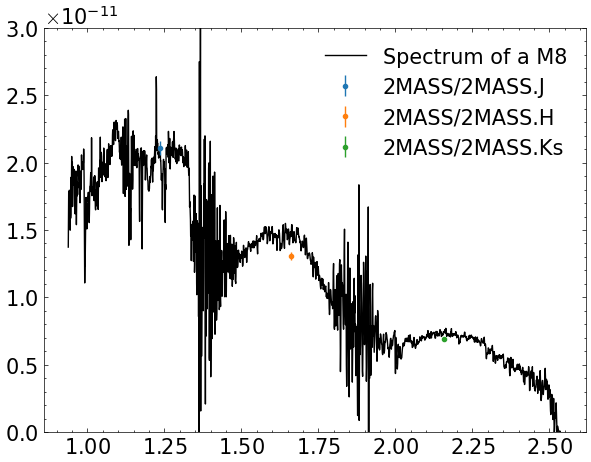

In [6]:
# Plot : 
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(spec["wave"], spec["flux"], label = "Spectrum of a M8", c='k')

for magfilter in ["2MASS/2MASS.J", "2MASS/2MASS.H", "2MASS/2MASS.Ks"] :
    ax.errorbar(phot_wave[magfilter], sed[magfilter][0], yerr = sed[magfilter][1], fmt = '.', label = magfilter)
ax.set_ylim(0,3e-11)
ax.legend()
plt.show()

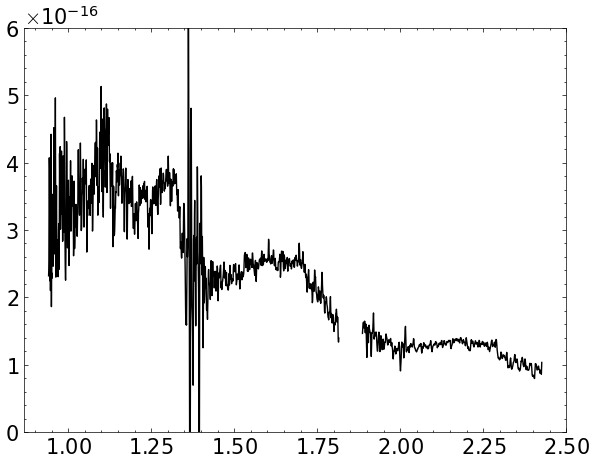

In [7]:
# Also load the spectrum from SIMP survey (comparison purposes)
with fits.open("sp1_SIMP041820112120_080302.fits") as f:
    data = f[0].data
    wave = data[0]
    flux = data[1] 
    noise = data[2]
    new_wave, new_flux, new_noise = resample_spectrum(wave, flux, resolution = 1000, 
                                                    noise = noise) 
    new_wave = new_wave * u.micron
    new_flux = new_flux * u.erg / u.s / u.cm**2 / u.micron
    new_noise = new_noise * u.erg / u.s / u.cm**2 / u.micron
# Place in splat and smooth it to the same resolution as the SOFI spectrum
spec_simp = QTable([new_wave, new_flux, new_noise], names = ["wave", "flux", "noise"]) 

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(spec_simp["wave"], spec_simp["flux"], label = "Spectrum of a M8", c='k')
ax.set_ylim(0,6e-16)
plt.show()

# Model : 
We load a model (or the sake of simplicity, BT-Settl AGSS models)

In [8]:
# For the sake of simplicity, BT-Settl (AGSS models)

agss_nometal_model  = ModelSpec("/home/travinet/Jupyter/model_treater/model_hdf5/agss2009_sofi_nometal.hdf5")
agss_nometal_phot  = ModelPhot("/home/travinet/Jupyter/model_treater/model_hdf5/agss2009_photometry_nometal.hdf5")

sofi_interpolator = agss_nometal_model.surface_interpolator
phot_interpolator = agss_nometal_phot.surface_interpolator
sofi_model_wave = agss_nometal_model.wave

model_bounds = agss_nometal_model.bounds
# Limit to logg > 3.5, bc else gives very wrong results
model_bounds[1][0] = 3.51
model_bounds # Teff and Logg

array([[1.30e+03, 3.90e+03],
       [3.51e+00, 6.00e+00]])

# Fit tests
## Base model : 
We use BT-Settl (AGSS) models, through wich we interpolate in the Teff/logg plane linearly. The models (which return surface flux) are then scaled to the observed flux, and the scaling factor is also fitted.
Thus, we have : 
$$ M(T_\mathrm{eff}, \log g, \Omega)  = \mathrm{Interpolator}(T_\mathrm{eff}, \log g) \times 10^\Omega$$

The model is then interpolated in the observed wavelength grid, and we use a a likelihood function with the form : 
$$ \log \mathcal{L} = -\frac{1}{2} \sum_i w_i \frac{\left(F_{\mathrm{obs}, i} - M_{\mathrm{model}, i}\right)^2}{\text{Var}_i}  - 
\frac{1}{2}\sum_i \left(\log (2\pi\text{Var}_i)\right)$$

In a first place, we don't use photometry, for testing purposes - we don't want to obtain the radius yet ; we just want to check what the error bars look like.

We use different weighting schemes :
- No weighting : $w_i = 1$
- Wavelength weighting : $w_i = \Delta \lambda_i$
- Renormalized wavelength weighting : $w_i = \frac{N}{\sum_i \Delta \lambda_i} \Delta \lambda_i $

Where we use different variances for tests : 
- $\text{Var}_i = \sigma_i^2$ : We assume the errors given by the data are correct.
- $\text{Var}_i = \sigma_i^2 + \left(\alpha_0\right)^2$ : We add a constant error to the data.
- $\text{Var}_i = \sigma_i^2 + \left(\alpha_0 + \alpha_1 M_{\mathrm{model}, i}\right)^2$ : We add a constant error and a relative error to the data.
- $\text{Var}_i = \sigma_i^2 + \left(\alpha_0 + \alpha_1 M_{\mathrm{model}, i} + \alpha_2 M_{\mathrm{model}, i}^2\right)^2$ : We add a constant error, a relative error and a quadratic error to the data.
- $\text{Var}_i = \sigma_i^2 + \left(\alpha_0 + \alpha_1 M_{\mathrm{model}, i} + \alpha_2 M_{\mathrm{model}, i}^2 + \alpha_3 M_{\mathrm{model}, i}^3\right)^2$ : We add a constant error, a relative error, a quadratic error and a cubic error to the data.

In [9]:
# Prepare the spectrum mask (ie, we mask the tellurics :-) )
spec_mask = (((spec["wave"] > 0.95 * u.micron) & (spec["wave"] < 1.35* u.micron) | (spec["wave"] > 1.41* u.micron) & (spec["wave"] < 1.81* u.micron)
             | (spec["wave"] > 1.95* u.micron) & (spec["wave"] < 2.45* u.micron)) & ~(np.isnan(spec["flux"])))

spec_simp_mask = (((spec_simp["wave"] > 0.95 * u.micron) & (spec_simp["wave"] < 1.35* u.micron) | (spec_simp["wave"] > 1.41* u.micron) & (spec_simp["wave"] < 1.81* u.micron)
                | (spec_simp["wave"] > 1.95* u.micron) & (spec_simp["wave"] < 2.45* u.micron)) & ~(np.isnan(spec_simp["flux"])))

spec_weights_ones = np.ones(len(spec["wave"][spec_mask]))
spec_simp_weights_ones = np.ones(len(spec_simp["wave"][spec_simp_mask]))

spec_weights_dlambda = np.diff(spec["wave"]).value
spec_weights_dlambda = np.append(spec_weights_dlambda, spec_weights_dlambda[-1])[spec_mask]
spec_simp_weights_dlambda = np.diff(spec_simp["wave"]).value
spec_simp_weights_dlambda = np.append(spec_simp_weights_dlambda, spec_simp_weights_dlambda[-1])[spec_simp_mask]

spec_weights_norm = len(spec_weights_dlambda) * spec_weights_dlambda / np.sum(spec_weights_dlambda)
spec_simp_weights_norm = len(spec_simp_weights_dlambda) * spec_simp_weights_dlambda / np.sum(spec_simp_weights_dlambda)

tempspec = spec[spec_mask]
spec_wave, spec_flux, spec_noise = tempspec["wave"].value.astype(float), tempspec["flux"].value.astype(float), tempspec["noise"].value.astype(float)

tempspec = spec_simp[spec_simp_mask]
spec_simp_wave, spec_simp_flux, spec_simp_noise = tempspec["wave"].value.astype(float), tempspec["flux"].value.astype(float), tempspec["noise"].value.astype(float)

## Util functions : 

In [10]:
# Prepare the ultranest functions :

def prepare_ultranest(lnlike, labels, bounds, spec_wave, spec_flux, spec_noise, spec_weights) : 
    # Cube transform : 
    @njit
    def cube_transform(cube) : 
        theta = cube.copy()
        for i in range(len(theta)) : 
            theta[i] = bounds[i][0] + (bounds[i][1] - bounds[i][0]) * theta[i]
        return theta
    # Simplified lnlike :
    @njit
    def lnlike_simple(theta) : 
        return lnlike(theta, spec_wave, spec_flux, spec_noise, spec_weights)
    # Ultranest sampler : 
    sampler = ultranest.ReactiveNestedSampler(labels, lnlike_simple, transform=cube_transform)
    return sampler   


def plot_ultranest(sampler, spec_wave, spec_flux):
    thetares = sampler.results['posterior']['median']
    model = sofi_interpolator((thetares[0], thetares[1])) * 10**thetares[2]
    sampler.plot_corner()
    fig, ax = plt.subplots(1, 1)
    ax.plot(spec_wave, spec_flux, label = "Data", c='k')
    ax.plot(sofi_model_wave, model, label = f"Model, $T_\mathrm{{eff}}$ = {thetares[0]:.0f} K, $\log g$ = {thetares[1]:.2f}", c='r')
    ax.legend()
    plt.show()
    sampler.print_results()
    return None

### Fit with no noise model

In [11]:
@njit
def lnlike_base(theta, wave, flux, noise, weights) : 
    teff, logg, scale = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = noise**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_base = ["Teff", "Logg", "Scale"]
bounds_base = np.array([*model_bounds, [-99, 1]])

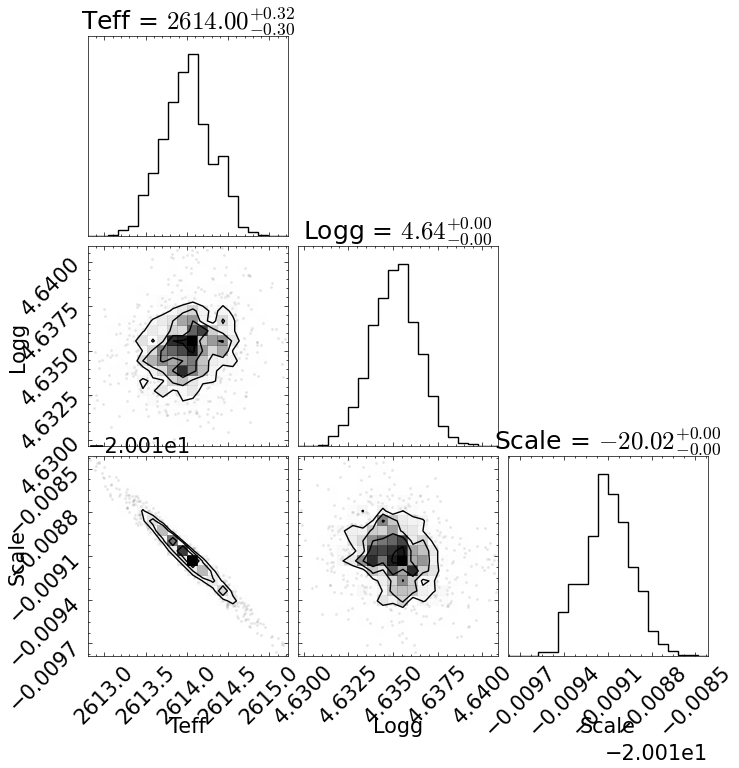

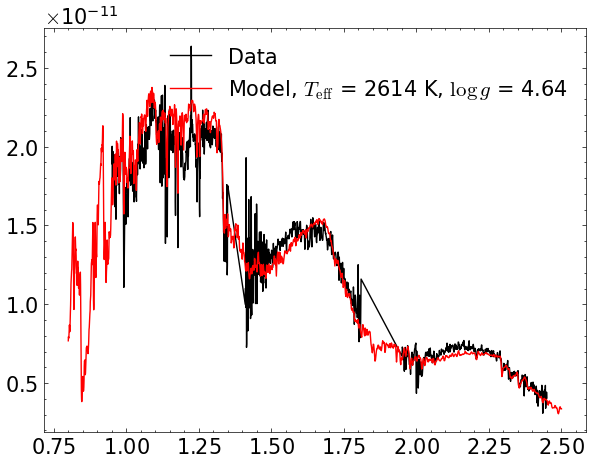


logZ = -479661.535 +- 0.780
  single instance: logZ = -479661.535 +- 0.261
  bootstrapped   : logZ = -479661.547 +- 0.780
  tail           : logZ = +- 0.001
insert order U test : converged: True correlation: inf iterations

    Teff                : 2612.72│ ▁   ▁▁▁ ▁▁▁▁▂▃▃▄▅▅▆▆▇▇▇▄▅▃▃▃▃▃▂▁▁▁▁▁▁ │2615.02    2614.01 +- 0.30
    Logg                : 4.6306│ ▁▁▁▁▁▁▂▂▃▃▆▄▅▇▇▇▇▇▅▆▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁ │4.6411    4.6351 +- 0.0014
    Scale               : -20.01969│ ▁▁▁▁▁▁▁▂▃▃▃▄▄▅▇▇▇▇▇▆▄▄▄▃▃▂▁▁▁▁▁▁▁   ▁ │-20.01838    -20.01910 +- 0.00016



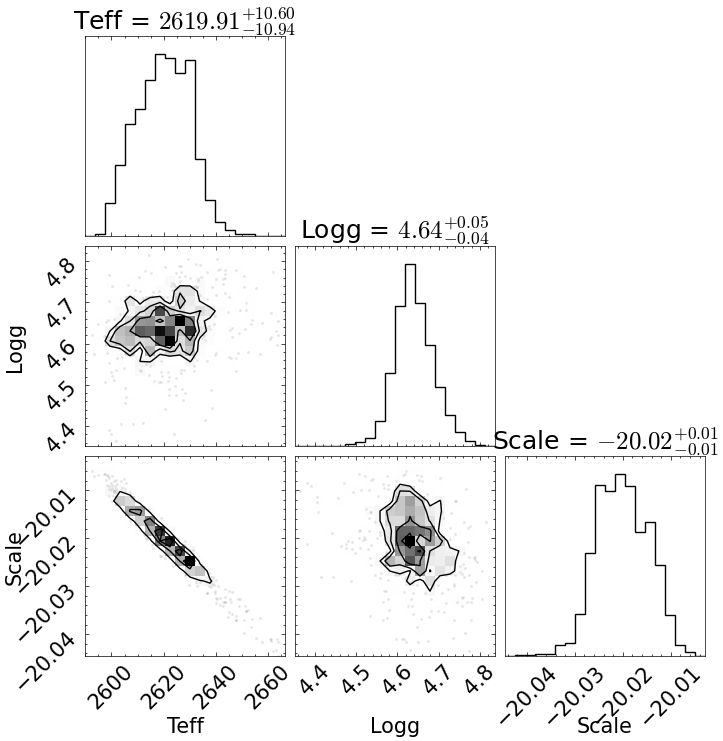

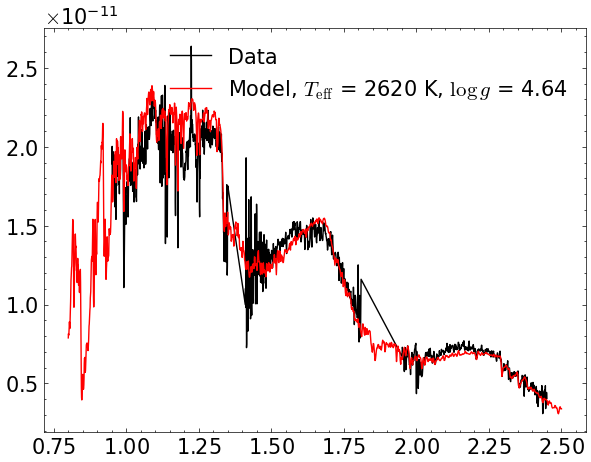


logZ = 44792.227 +- 0.475
  single instance: logZ = 44792.227 +- 0.207
  bootstrapped   : logZ = 44792.095 +- 0.475
  tail           : logZ = +- 0.007
insert order U test : converged: True correlation: inf iterations

    Teff                : 2589.0│ ▁▁ ▁▂▂▃▃▄▄▆▄▆▇▅▇▄▇▅▅▆▃▂▂▁▁▁▁▁▁▁▁ ▁▁ ▁ │2667.3    2620.0 +- 10.0
    Logg                : 4.425 │ ▁ ▁ ▁▁ ▁▁▁▁▁▁▂▄▃▄▅▆▇▇▇▅▃▄▄▄▂▂▂▁▁▁▁▁▁▁ │4.809     4.640 +- 0.047
    Scale               : -20.0434│ ▁▁ ▁ ▁▁▁▁▁▁▁▂▂▃▃▅▆▄▆▅▅▇▅▅▅▄▅▄▄▃▂▂▁▁▁▁ │-20.0043    -20.0201 +- 0.0054



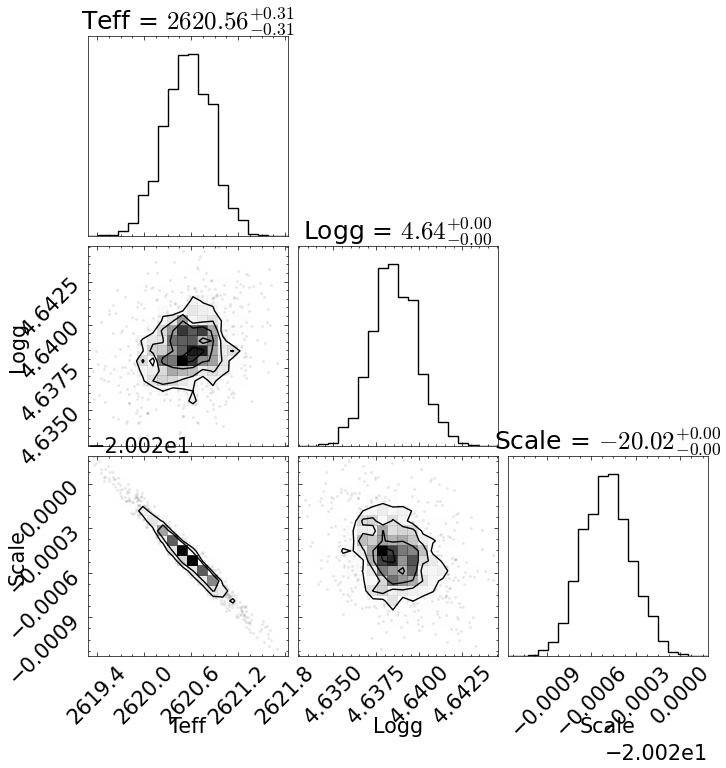

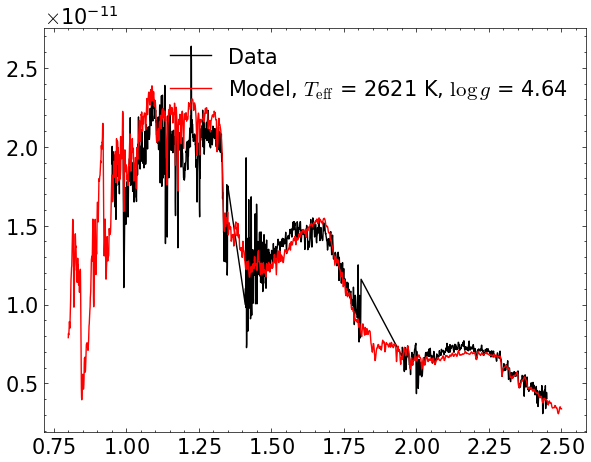


logZ = -488536.327 +- 0.780
  single instance: logZ = -488536.327 +- 0.264
  bootstrapped   : logZ = -488536.238 +- 0.780
  tail           : logZ = +- 0.001
insert order U test : converged: True correlation: inf iterations

    Teff                : 2619.28│ ▁ ▁▁▁▁▁▁▁▁▂▃▂▃▄▅▅▆▇▇▆▆▅▆▅▅▂▂▂▁▁▁▁ ▁ ▁ │2621.70    2620.56 +- 0.30
    Logg                : 4.6329│ ▁▁ ▁▁▁▁▁▁▁▂▃▄▅▆▇▇▇▇▇▆▆▅▃▂▂▂▁▁▁▁▁▁▁  ▁ │4.6445    4.6386 +- 0.0013
    Scale               : -20.02107│ ▁ ▁▁▁▁▁▁▂▂▄▅▄▅▆▅▇▆▇▆▅▅▃▃▂▂▂▁▁▁▁▁▁▁ ▁▁ │-20.01980    -20.02049 +- 0.00016



In [63]:
ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_wave, spec_flux, spec_noise, spec_weights_ones)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_wave, spec_flux, spec_noise, spec_weights_dlambda)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

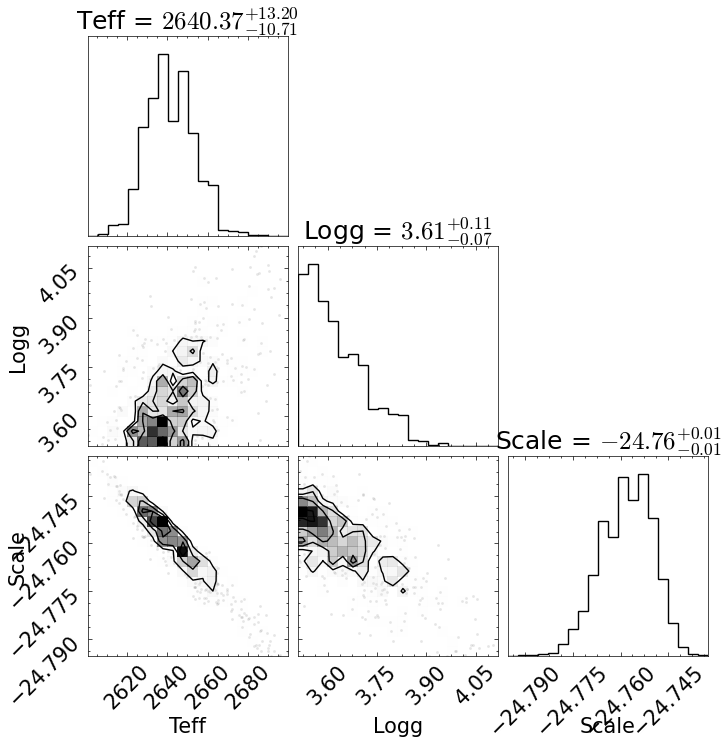

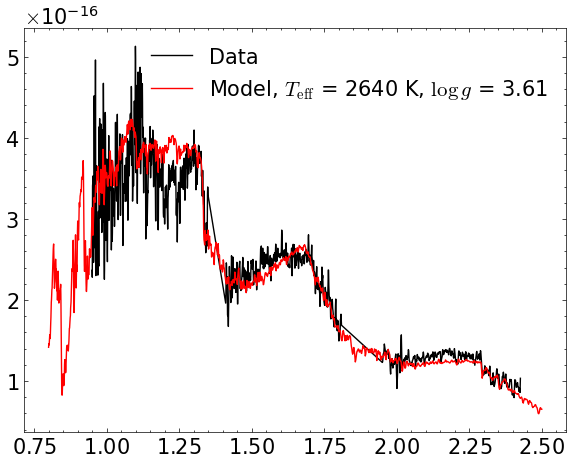


logZ = 60450.098 +- 0.882
  single instance: logZ = 60450.098 +- 0.204
  bootstrapped   : logZ = 60450.134 +- 0.882
  tail           : logZ = +- 0.007
insert order U test : converged: True correlation: inf iterations

    Teff                : 2603  │ ▁▁▁▁▁▁▂▂▃▅▄▅▇▇▄▅▅▆▅▃▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁ │2698      2641 +- 12
    Logg                : 3.510 │▇▇▇▇▇▆▆▅▇▄▃▄▄▅▄▃▂▂▂▂▁▁▂▂▂▁▁▁▁  ▁▁  ▁▁▁ │4.033     3.629 +- 0.091
    Scale               : -24.7970│ ▁  ▁▁▁▁▁▁▁▁▁▂▂▂▃▅▆▆▅▅▇▇▆▇▆▅▅▃▃▂▁ ▁▁ ▁ │-24.7311    -24.7582 +- 0.0082



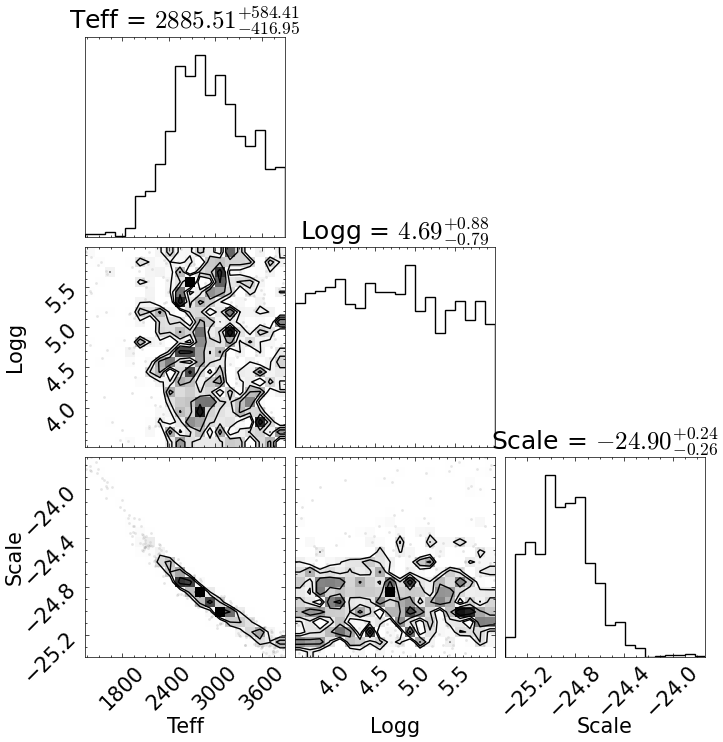

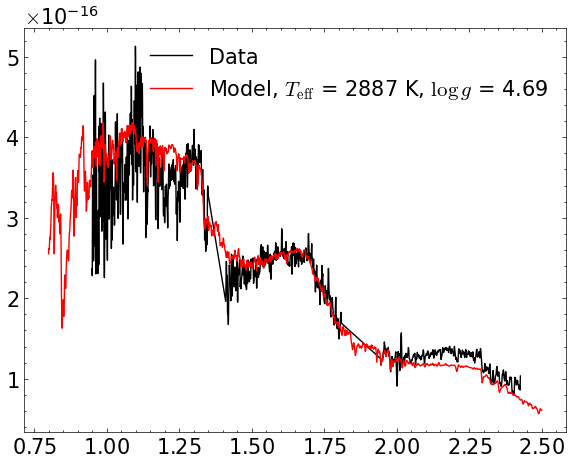


logZ = 61010.275 +- 0.423
  single instance: logZ = 61010.275 +- 0.131
  bootstrapped   : logZ = 61010.252 +- 0.423
  tail           : logZ = +- 0.000
insert order U test : converged: True correlation: inf iterations

    Teff                : 1300  │▁▁▁▁▁  ▁▁▁▁▃▂▁▂▄▄▄▆▆▆▅▇▇▅▅▆▆▄▄▃▄▃▃▄▃▃▄▂│3900      2932 +- 475
    Logg                : 3.51  │▆▅▄▇▅▇▅▇▅▆▅▅▅▆▆▄▆▅▇▄▆▄▇▅▅▄▅▄▄▅▃▃▇▅▅▄▆▄▅│6.00      4.72 +- 0.71
    Scale               : -25.46│ ▁▁▃▅▄▅▅▄▇▇▅▇▇▆▇▇▄▄▃▂▁▂▁▁▁ ▁ ▁  ▁▁ ▁▁▁ │-23.72    -24.90 +- 0.24



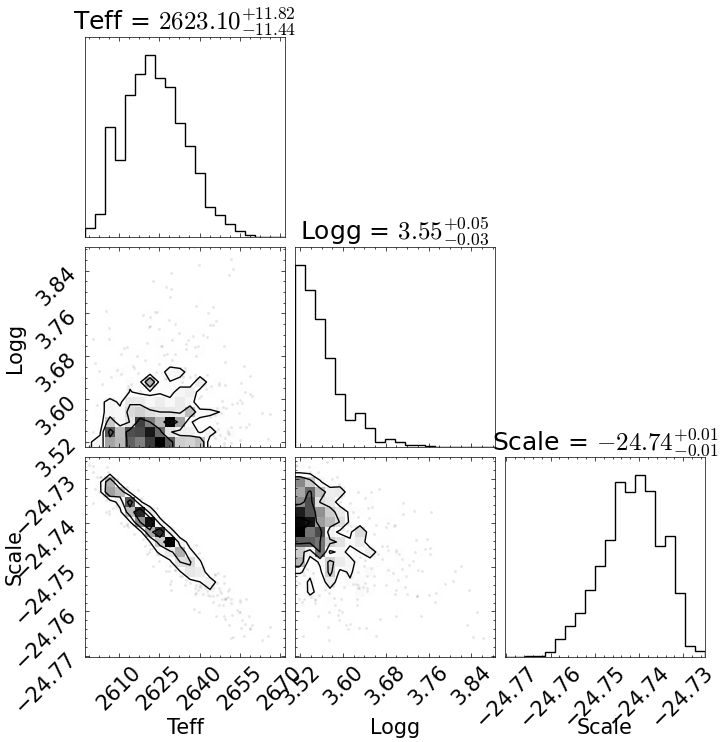

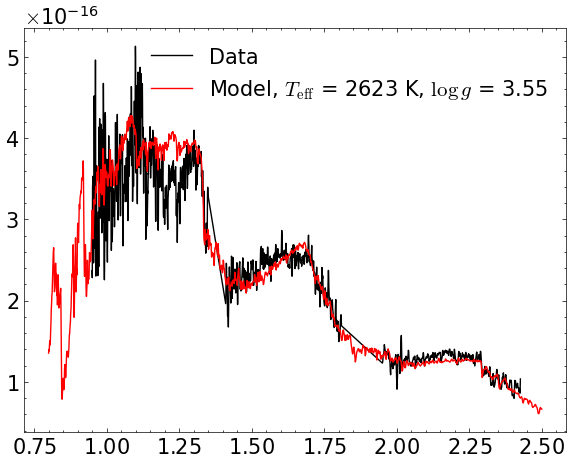


logZ = 60480.935 +- 0.340
  single instance: logZ = 60480.935 +- 0.207
  bootstrapped   : logZ = 60480.911 +- 0.340
  tail           : logZ = +- 0.006
insert order U test : converged: True correlation: inf iterations

    Teff                : 2596  │ ▁▁▁▂▃▄▆▃▃▆▆▆▇▇▅▇▇▇▆▄▅▄▄▃▄▃▂▁▁▁▁▁▁▁▁▁▁ │2662      2623 +- 11
    Logg                : 3.510 │▇▆▇▆▅▅▅▃▄▄▂▂▂▁▂▂▁▁▁▁▁▁ ▁▁▁▁▁▁▁▁ ▁▁ ▁ ▁ │3.821     3.561 +- 0.044
    Scale               : -24.7657│ ▁▁▁▁▁▁▁▁▂▂▂▁▃▃▁▅▃▄▆▆▆▇▄▆▇▇▃▅▃▄▃▅▂▂▁▁▁ │-24.7250    -24.7418 +- 0.0066



In [64]:
ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_ones)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_dlambda)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

ut_sampler = prepare_ultranest(lnlike_base, labels_base, bounds_base, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

We find that, for both test case, the weights $w_i = \Delta \lambda_i$ returns wrong results. $w_i = 1$ and $w_i = \frac{N}{\sum_i \Delta \lambda_i} \Delta \lambda_i $ return the same results, and we'll stick to the latter for the rest of the tests.

## Test with different variances : 
We add up some variances proportional to the models (or quadratic, or cubic, or constant). 

In [65]:
@njit
def lnlike_0(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0 = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = noise**2 + (alpha_0 * np.median(model_flux))**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_0 = ["Teff", "Logg", "Scale", r"$\alpha_0$"]
bounds_0 = np.array([*bounds_base, [0, 1]])

@njit
def lnlike_1(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0, alpha_1 = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = noise**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_1 = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$"]
bounds_1 = np.array([*bounds_base, [0, 1], [0, 1]])

@njit
def lnlike_2(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0, alpha_1, alpha_2 = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = noise**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2 + (alpha_2 * model_flux**2)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_2 = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$", r"$\alpha_2$"]
bounds_2 = np.array([*bounds_base, [0, 1], [0, 1], [0, 1]])

@njit
def lnlike_3(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0, alpha_1, alpha_2, alpha_3 = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = noise**2 + noise**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2 + (alpha_2 * model_flux**2)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_3 = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$", r"$\alpha_2$", r"$\alpha_3$"]
bounds_3 = np.array([*bounds_base, [0, 1], [0, 1], [0, 1], [0, 1]])
                    

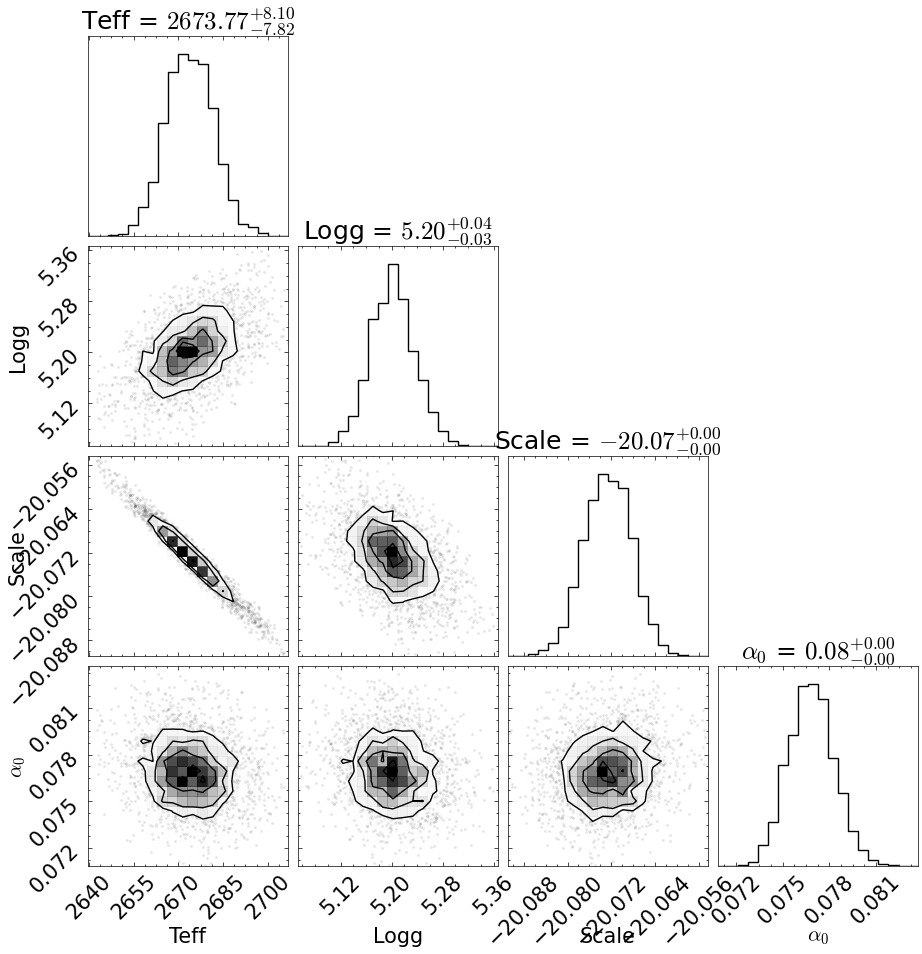

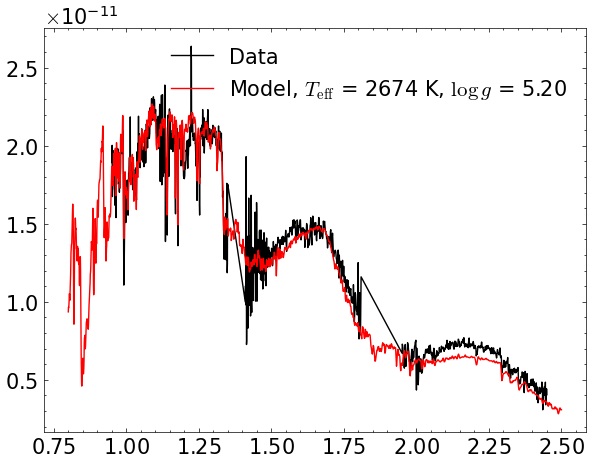


logZ = 39432.434 +- 0.443
  single instance: logZ = 39432.434 +- 0.237
  bootstrapped   : logZ = 39432.466 +- 0.443
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2640.5│ ▁▁▁▁▁▁▁▁▁▂▂▂▃▅▆▇▇▇▇▇▇▇▇▅▄▃▃▂▁▁▁▁▁▁▁▁▁ │2705.9    2673.9 +- 8.0
    Logg                : 5.061 │ ▁▁▁▁▁▁▁▁▂▂▃▄▅▆▅▇▇▇▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁▁  ▁ │5.371     5.201 +- 0.035
    Scale               : -20.0901│ ▁▁▁▁▁▁▁▁▁▂▂▄▄▅▆▆▇▇▇▇▇▆▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁ │-20.0536    -20.0727 +- 0.0043
    $\alpha_0$          : 0.0714│ ▁▁▁▁▁▁▁▂▂▃▄▅▅▆▇▇▇▇▆▆▄▄▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁ │0.0837    0.0768 +- 0.0015



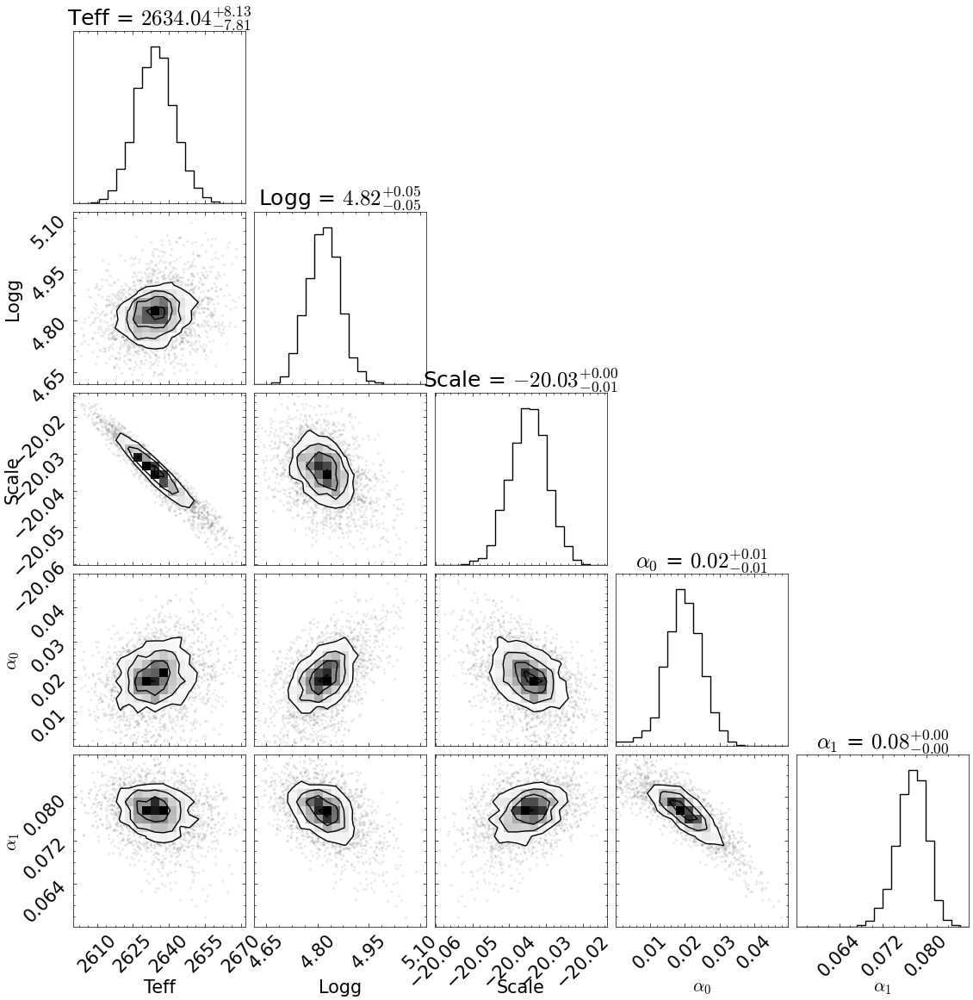

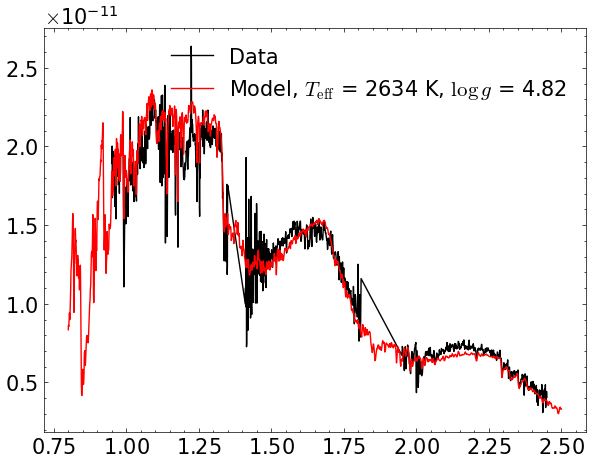


logZ = 39469.273 +- 0.416
  single instance: logZ = 39469.273 +- 0.256
  bootstrapped   : logZ = 39469.270 +- 0.416
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2596.7│ ▁  ▁▁▁▁▁▁▁▂▂▃▄▅▆▆▇▇▇▇▅▅▄▃▂▂▁▁▁▁▁▁▁▁ ▁ │2671.3    2634.2 +- 8.1
    Logg                : 4.628 │ ▁▁▁▁▁▁▁▂▂▃▃▄▅▆▆▇▇▆▆▆▄▃▃▂▁▁▁▁▁▁▁▁▁▁▁ ▁ │5.061     4.818 +- 0.048
    Scale               : -20.0587│ ▁ ▁▁ ▁▁▁▁▁▁▂▃▄▄▅▆▆▇▇▇▇▆▅▃▃▂▂▁▁▁▁▁▁▁ ▁ │-20.0123    -20.0348 +- 0.0051
    $\alpha_0$          : 0.0000│▁▁▁▁▁▁▁▁▁▁▂▂▄▄▅▅▆▇▇▇▆▅▅▄▃▃▂▁▁▁▁▁▁▁▁ ▁▁ │0.0419    0.0197 +- 0.0054
    $\alpha_1$          : 0.0635│ ▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▃▄▅▆▇▇▇▇▇▆▅▄▂▂▁▁▁▁▁▁▁▁ │0.0882    0.0773 +- 0.0028



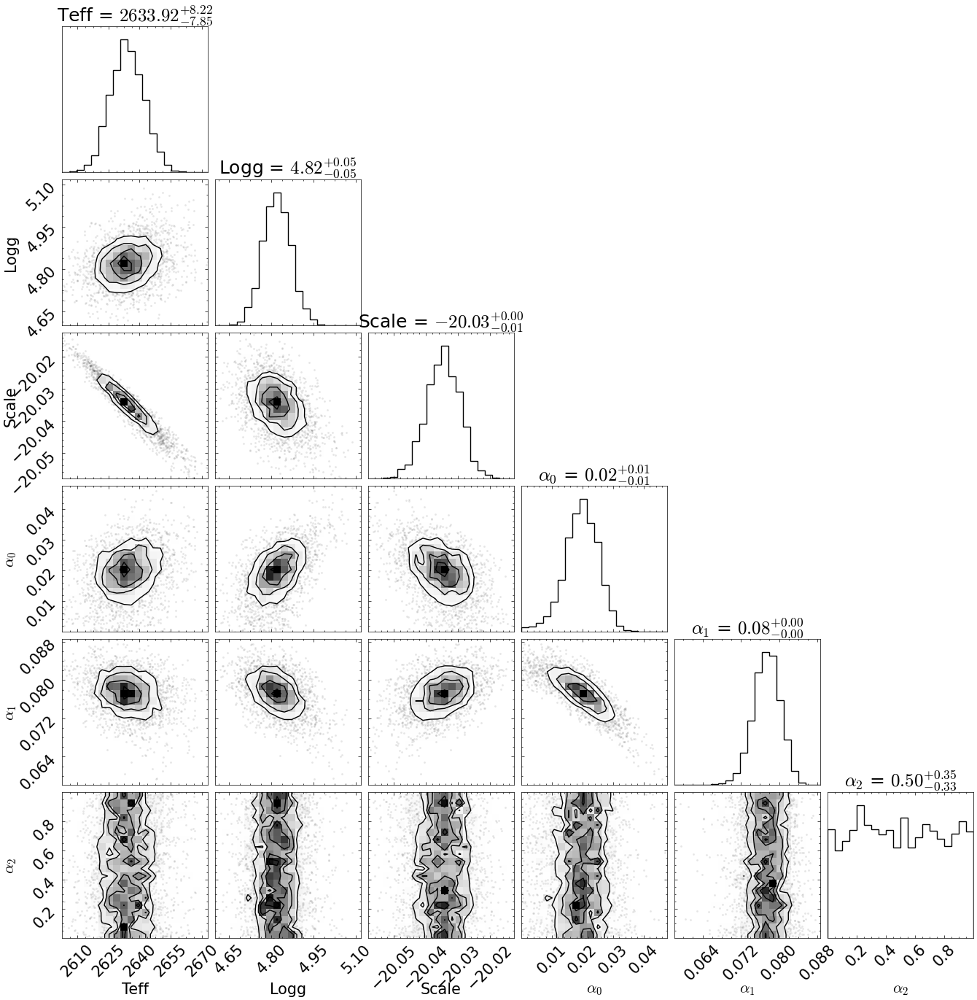

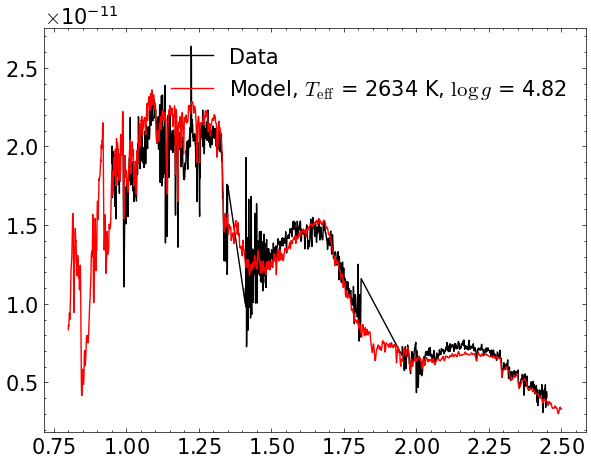


logZ = 39469.750 +- 0.310
  single instance: logZ = 39469.750 +- 0.254
  bootstrapped   : logZ = 39469.718 +- 0.310
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2601.6│ ▁▁▁▁▁▁▁▁▁▂▂▄▄▅▅▆▇▆▇▆▅▅▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁ │2669.6    2634.1 +- 8.1
    Logg                : 4.613 │ ▁▁▁▁▁▁▁▁▂▂▂▄▅▆▆▇▇▇▇▆▆▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁ │5.061     4.819 +- 0.050
    Scale               : -20.0593│ ▁▁▁▁ ▁▁▁▁▁▁▁▂▃▃▄▅▆▇▆▇▇▆▅▅▄▃▂▁▁▁▁▁▁▁▁▁ │-20.0139    -20.0347 +- 0.0052
    $\alpha_0$          : 0.0000│▁▁▁▁▁▁▁▂▂▃▄▃▅▆▇▇▇▇▆▅▅▄▃▂▁▁▁▁▁▁▁      ▁ │0.0477    0.0195 +- 0.0056
    $\alpha_1$          : 0.0627│ ▁ ▁▁▁▁▁▁▁▁▁▁▁▂▂▄▄▄▆▇▆▇▇▆▅▄▄▃▂▁▁▁▁▁▁▁▁ │0.0887    0.0774 +- 0.0028
    $\alpha_2$          : 0.00  │▆▆▆▄▆▅▆▆▇▇▆▇▆▆▆▇▅▆▅▇▇▆▅▅▆▆▆▇▇▅▇▄▅▅▆▇▇▇▆│1.00      0.50 +- 0.29



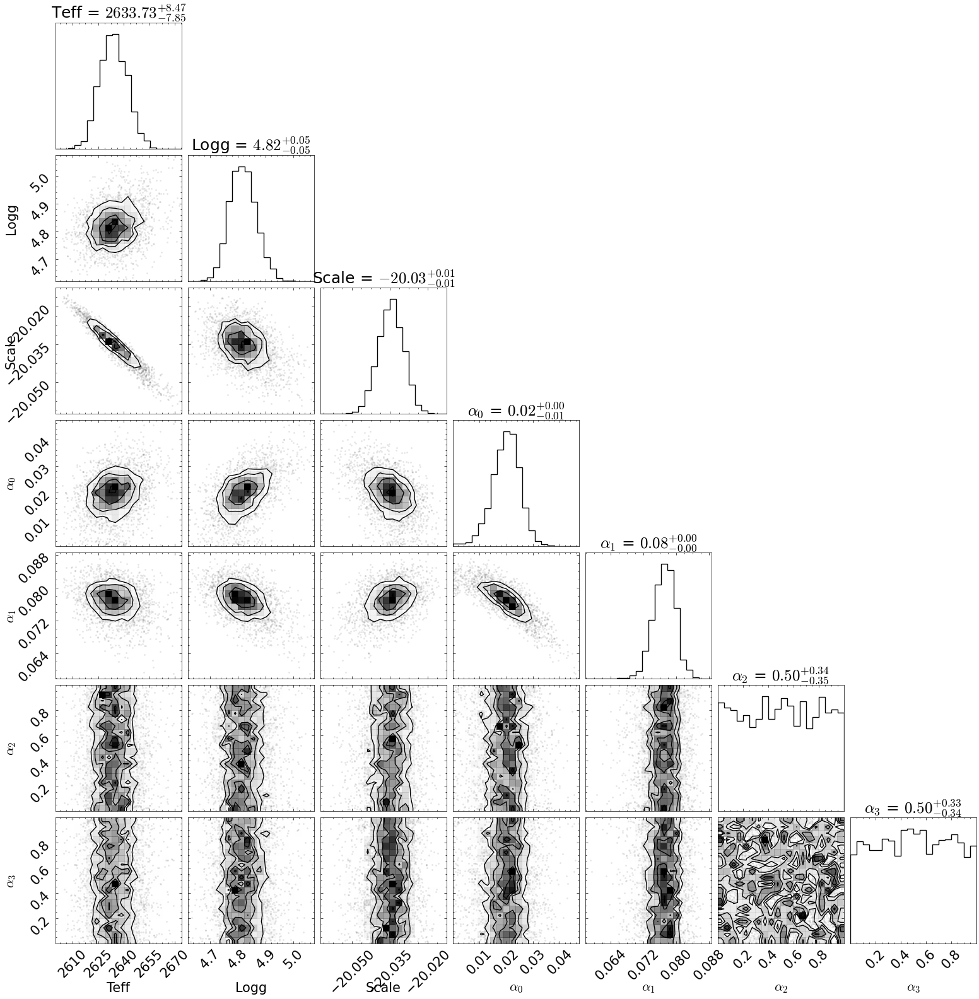

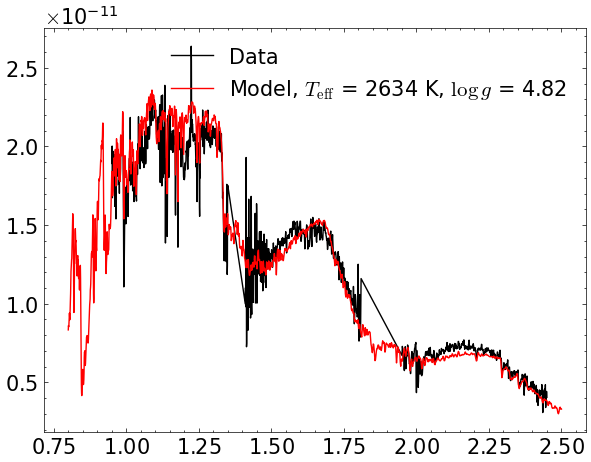


logZ = 39470.461 +- 0.407
  single instance: logZ = 39470.461 +- 0.255
  bootstrapped   : logZ = 39470.443 +- 0.407
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2602.8│ ▁▁▁▁▁▁▁▁▁▂▃▄▅▅▇▆▇▆▇▅▅▅▄▃▃▂▁▁▁▁▁▁▁▁▁▁▁ │2670.0    2634.0 +- 8.0
    Logg                : 4.605 │ ▁  ▁▁▁▁▁▁▁▂▃▄▆▆▇▇▇▇▆▄▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁ │5.059     4.819 +- 0.048
    Scale               : -20.0582│ ▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▅▅▆▆▇▇▇▅▆▅▄▃▂▂▁▁▁▁▁▁▁▁ │-20.0147    -20.0347 +- 0.0050
    $\alpha_0$          : 0.0000│▁▁▁▁▁▁▁▁▁▂▃▃▅▆▆▆▇▇▇▆▅▃▂▂▁▁▁▁▁▁▁▁ ▁   ▁ │0.0476    0.0198 +- 0.0052
    $\alpha_1$          : 0.0580│ ▁     ▁  ▁▁▁▁▁▁▁▁▂▂▃▅▆▆▇▇▇▆▅▄▂▁▁▁▁▁▁▁ │0.0877    0.0771 +- 0.0027
    $\alpha_2$          : 0.00  │▇▇▆▇▇▆▅▆▇▅▅▅▆▇▇▆▆▆▇▆▇▇▇▆▅▆▇▄▆▆▆▇▇▆▆▆▆▇▅│1.00      0.50 +- 0.29
    $\alpha_3$          : 0.00  │▅▅▅▇▆▆▆▅▆▅▇▇▆▆▅▆▆▇▇▆▆▆▇▆▆▅▅▆▇▇▆▆▇▆▆▅▆▆▆│1.00      0.50 +- 0.28



In [66]:
ut_sampler = prepare_ultranest(lnlike_0, labels_0, bounds_0, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_1, labels_1, bounds_1, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_2, labels_2, bounds_2, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_3, labels_3, bounds_3, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)


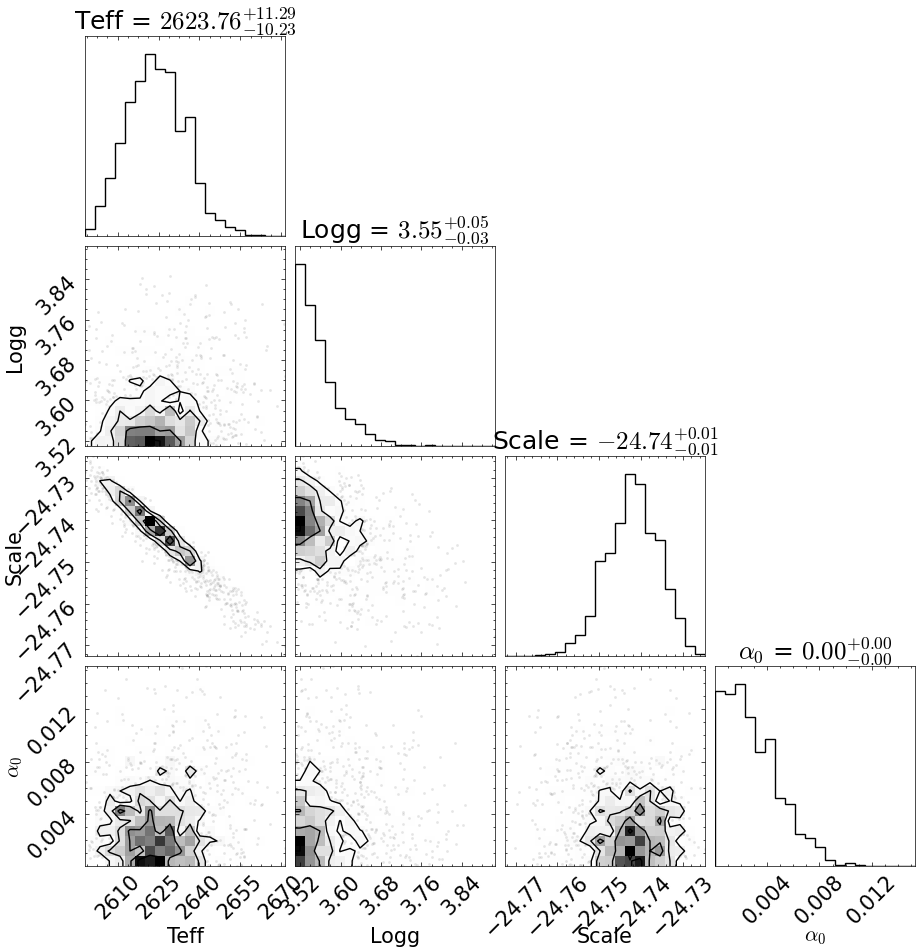

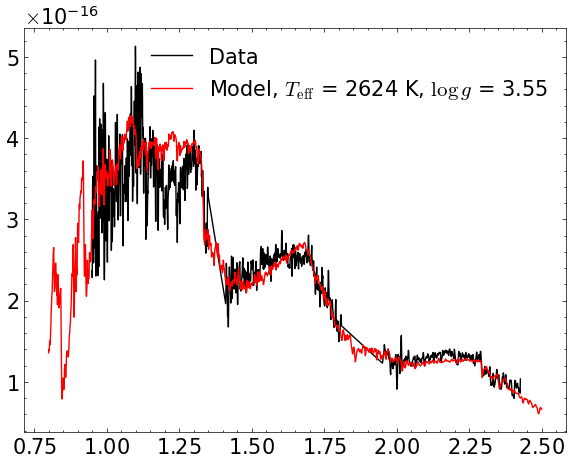


logZ = 60475.572 +- 0.643
  single instance: logZ = 60475.572 +- 0.235
  bootstrapped   : logZ = 60475.570 +- 0.643
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2596  │ ▁▁▁▂▂▃▄▄▅▆▅▇▅▇▆▇▅▆▄▄▅▃▂▂▁▁▁▁▁▁▁▁ ▁  ▁ │2669      2624 +- 10
    Logg                : 3.510 │▇▆▅▅▄▃▃▂▁▂▁▁▁▁▁▁▁▁▁▁▁ ▁▁ ▁           ▁ │3.958     3.558 +- 0.042
    Scale               : -24.7722│ ▁   ▁▁▁▁▁▁▁▁▁▁▂▃▄▄▄▅▅▆▇▇▇▅▅▆▄▃▂▂▁▁▁▁▁ │-24.7225    -24.7421 +- 0.0063
    $\alpha_0$          : 0.0000│▆▇▇▆▇▇▇▆▄▅▅▄▅▃▂▃▃▂▁▁▂▁▁▁▁▁▁▁▁▁ ▁ ▁  ▁▁ │0.0143    0.0029 +- 0.0021



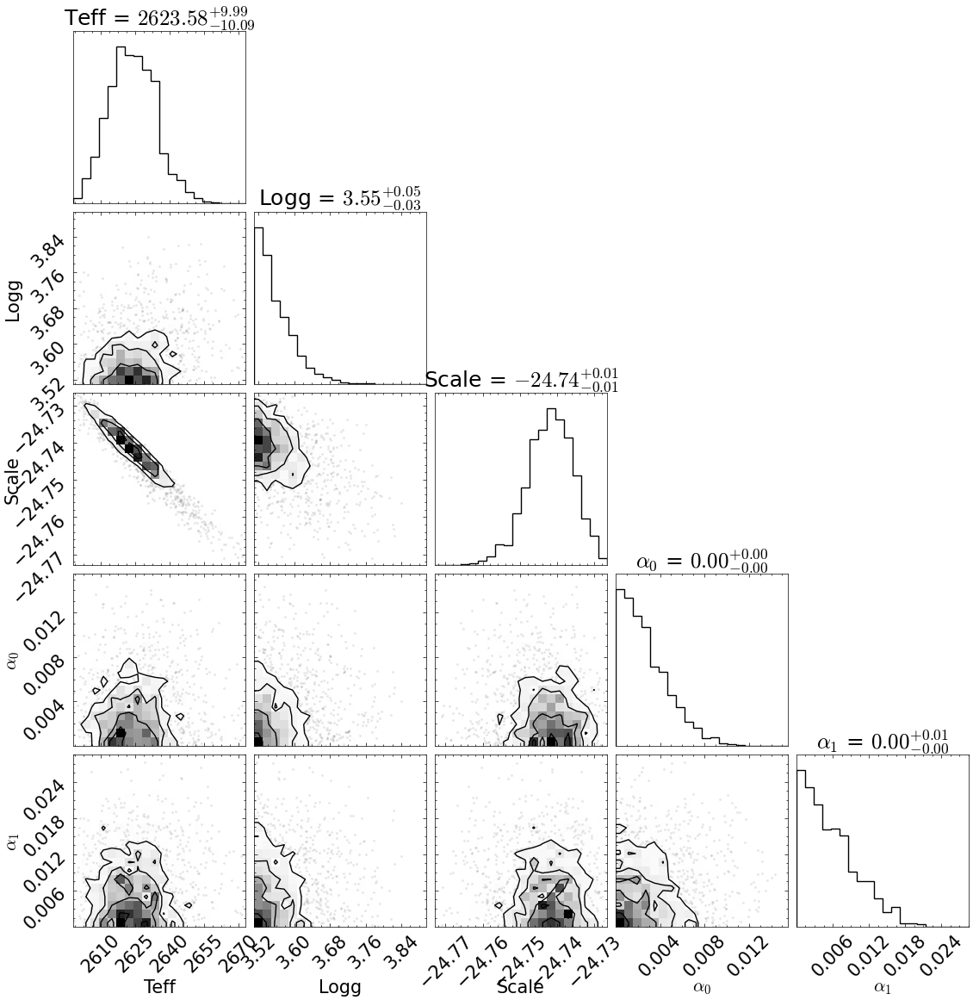

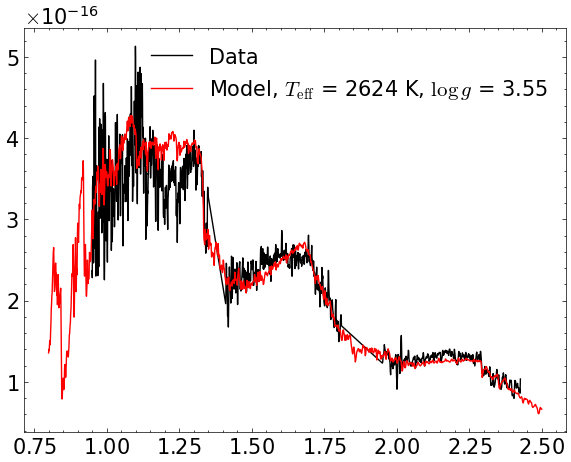


logZ = 60471.179 +- 0.567
  single instance: logZ = 60471.179 +- 0.256
  bootstrapped   : logZ = 60471.101 +- 0.567
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2597  │ ▁▁▂▂▂▃▄▅▅▆▇▇▆▇▇▆▆▇▅▃▃▁▂▂▁▁▁▁▁▁▁▁ ▁  ▁ │2671      2624 +- 10
    Logg                : 3.510 │▇▇▆▆▅▄▃▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ │3.807     3.559 +- 0.042
    Scale               : -24.7708│ ▁▁  ▁▁▁▁▁▁▁▁▁▁▁▃▃▃▅▆▆▆▇▇▇▇▇▆▅▄▄▃▁▂▂▁▁ │-24.7251    -24.7419 +- 0.0061
    $\alpha_0$          : 0.0000│▅▇▆▆▆▅▅▅▄▃▃▄▃▃▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁▁ ▁ │0.0143    0.0028 +- 0.0021
    $\alpha_1$          : 0.0000│▇▇▆▆▆▆▅▅▅▅▅▃▄▃▂▂▂▃▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁  ▁ ▁ │0.0264    0.0058 +- 0.0044



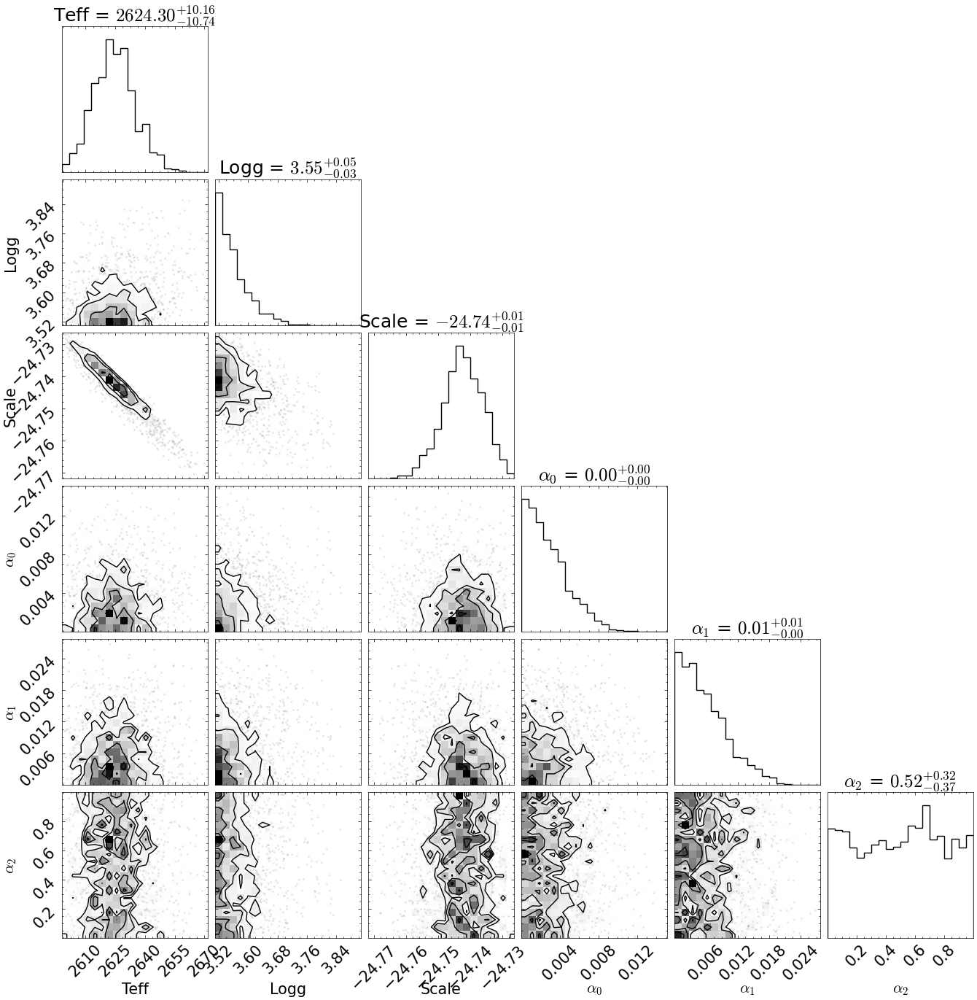

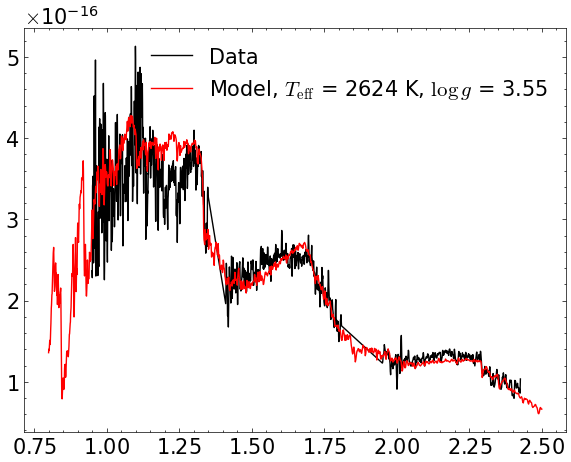


logZ = 60470.650 +- 0.770
  single instance: logZ = 60470.650 +- 0.258
  bootstrapped   : logZ = 60470.719 +- 0.770
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2595  │ ▁▁▁▂▁▂▃▃▅▅▄▅▅▇▇▇▅▆▇▅▃▂▂▄▂▂▁▂▁▁▁▁▁▁▁ ▁ │2666      2624 +- 10
    Logg                : 3.510 │▇▆▆▄▄▄▄▃▃▂▃▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁▁▁▁▁▁▁▁ │3.818     3.560 +- 0.044
    Scale               : -24.7686│ ▁ ▁▁▁▁▁▁▁▁▁▂▂▂▂▃▃▄▄▇▆▆▇▆▅▅▄▅▄▃▃▂▁▂▁▁▁ │-24.7245    -24.7424 +- 0.0063
    $\alpha_0$          : 0.0000│▇▇▇▇▆▆▆▅▄▅▅▄▃▃▂▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ │0.0142    0.0028 +- 0.0021
    $\alpha_1$          : 0.0000│▅▇▆▅▆▆▅▄▅▆▄▄▅▃▅▂▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁ │0.0231    0.0058 +- 0.0043
    $\alpha_2$          : 0.00  │▆▅▆▅▅▆▅▄▄▅▄▅▅▄▆▄▄▅▆▄▆▄▅▇▅▆▇▅▅▆▄▃▅▅▅▅▄▅▅│1.00      0.50 +- 0.29



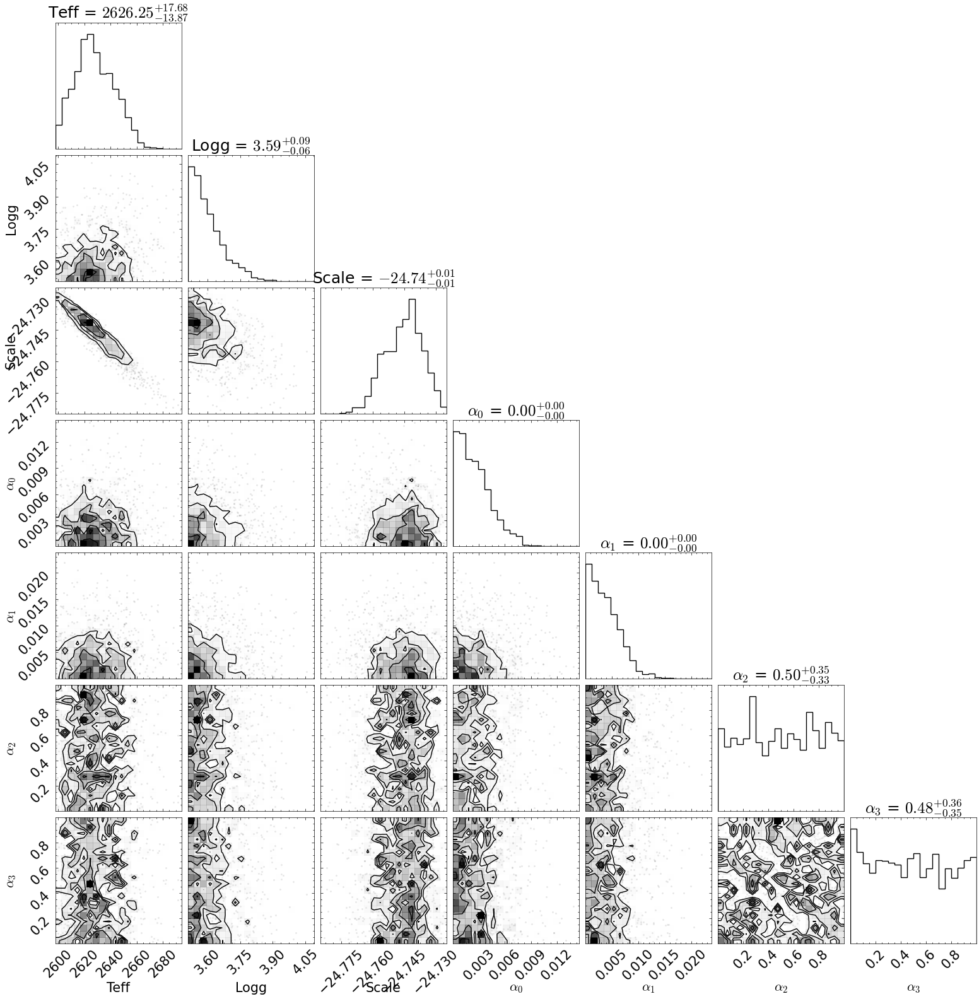

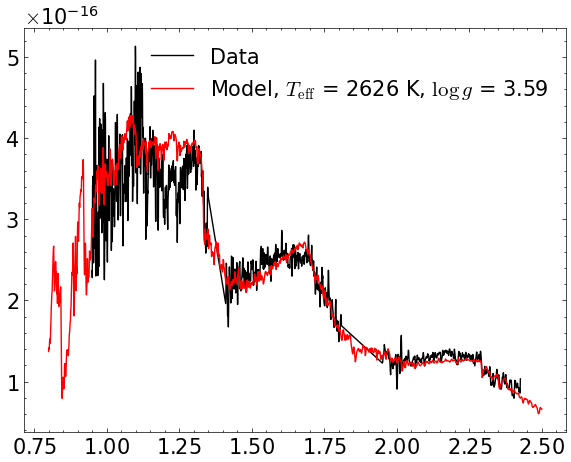


logZ = 60161.718 +- 0.318
  single instance: logZ = 60161.718 +- 0.253
  bootstrapped   : logZ = 60161.640 +- 0.318
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2594  │ ▁▂▂▃▃▃▅▅▄▆▆▇▅▆▅▅▄▅▃▄▄▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁ │2686      2628 +- 15
    Logg                : 3.510 │▇▇▇▆▆▅▆▆▃▄▃▂▃▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁  ▁ │3.999     3.601 +- 0.074
    Scale               : -24.7790│ ▁▁ ▁▁▁▁▁▁▁▁▂▂▃▄▄▄▅▃▅▅▅▅▇▇▆▅▆▄▄▃▃▃▁▁▁▁ │-24.7222    -24.7453 +- 0.0089
    $\alpha_0$          : 0.0000│▇▆▇▇▆▅▄▆▄▅▄▅▃▃▂▃▂▁▁▁▁▁▁▁▁▁▁ ▁▁▁  ▁  ▁▁ │0.0131    0.0025 +- 0.0019
    $\alpha_1$          : 0.0000│▇▇▇▆▇▆▅▇▄▅▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁▁▁   ▁ │0.0216    0.0038 +- 0.0028
    $\alpha_2$          : 0.00  │▅▅▅▃▅▄▃▅▃▇▆▆▄▄▃▄▄▆▅▃▄▅▅▆▃▄▄▆▅▄▅▅▄▅▆▅▄▅▄│1.00      0.50 +- 0.29
    $\alpha_3$          : 0.00  │▆▇▆▅▄▅▅▅▅▄▅▅▅▅▅▄▄▄▅▆▅▇▄▃▄▆▆▃▄▅▃▄▅▆▄▅▅▆▄│1.00      0.48 +- 0.30



In [67]:
ut_sampler = prepare_ultranest(lnlike_0, labels_0, bounds_0, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

ut_sampler = prepare_ultranest(lnlike_1, labels_1, bounds_1, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

ut_sampler = prepare_ultranest(lnlike_2, labels_2, bounds_2, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

ut_sampler = prepare_ultranest(lnlike_3, labels_3, bounds_3, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)


So : 
- There's apparently some noise missing in the noise estimation of our sofi spectra (of the oder of ~7% of our flux)
- Using a noise model composed of a constant $\alpha_0$ term and of a proportional to the model $\alpha_1\cdot M$ seems to effectivelly correct it - we match the uncertainties found from our test spectrum from the SIMP survey. 
- SIMP survey spectrum do not seems to have systematics uncertainties - And the used spectra is a peculiar one, hence the low logg.
- Adding more than a proportional-to-model variance does not change the results. 
- Uncertainties are still very small. (Too small?)

For the following tests, we adopt the stated variance : $\text{Var}_i = \sigma_i^2 + \alpha_0^2 + \alpha_1^2 M_{\mathrm{model}, i}^2$. 

## One last uncertainty test : Increasing the noise by some factor.

In [68]:
@njit
def lnlike_factor(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0, alpha_1, beta = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, sofi_model_wave, model)
    data_variance = (beta*noise)**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_factor = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$", r"$\beta$"]
bounds_factor = np.array([*bounds_base, [0, 1], [0, 1], [0, 100.0]])

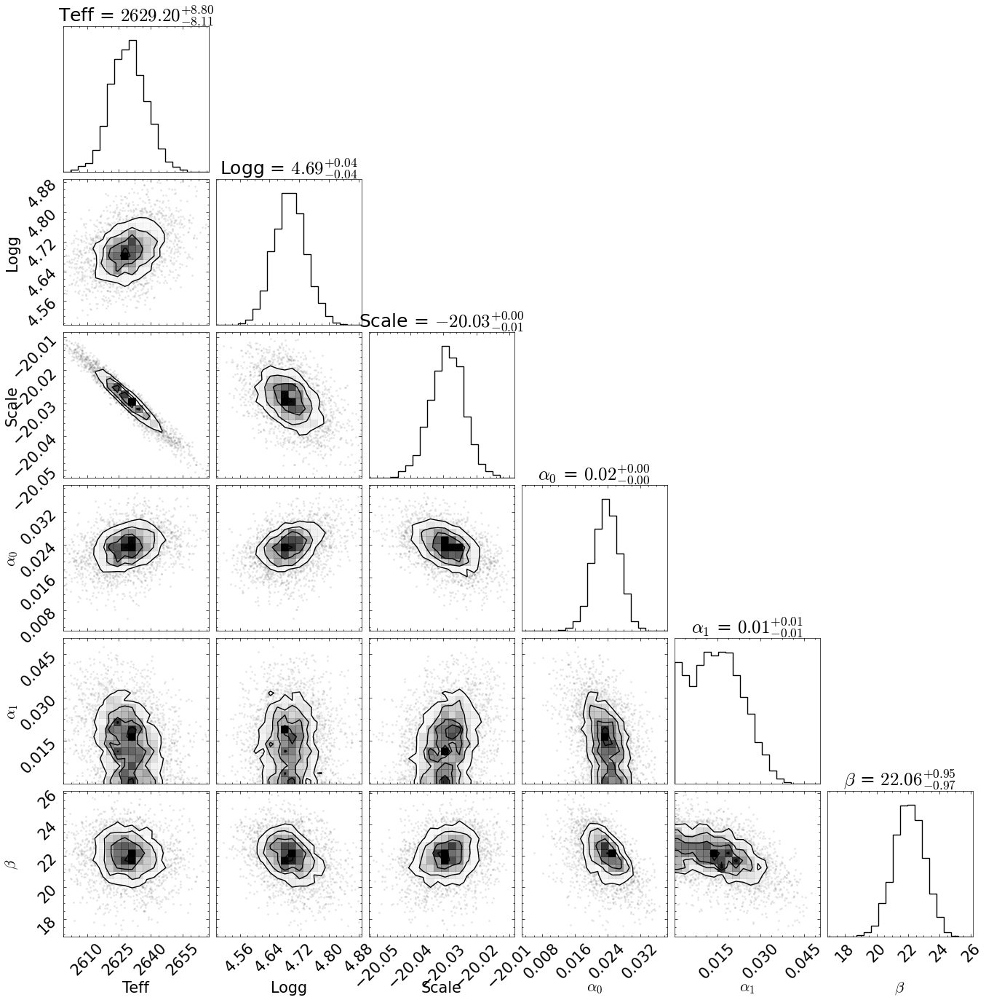

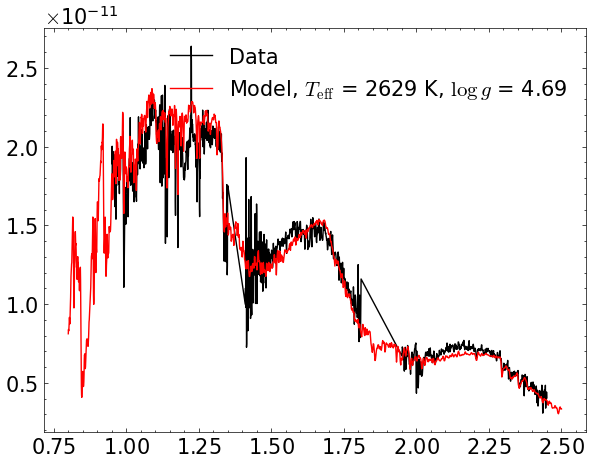


logZ = 39564.543 +- 0.410
  single instance: logZ = 39564.543 +- 0.271
  bootstrapped   : logZ = 39564.569 +- 0.410
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2597.2│ ▁▁▁▁▁▁▁▂▂▂▃▅▅▆▇▇▇▇▅▅▄▄▃▂▂▁▁▁▁▁▁▁▁ ▁▁▁ │2670.3    2629.3 +- 8.6
    Logg                : 4.481 │ ▁   ▁▁▁▁▁▁▁▂▂▃▄▄▅▆▇▇▆▆▅▅▄▃▂▂▁▁▁▁▁▁▁▁▁ │4.882     4.693 +- 0.044
    Scale               : -20.0546│ ▁▁  ▁▁▁▁▁▁▁▁▁▂▃▃▄▅▆▇▇▇▆▇▆▆▃▃▂▂▁▁▁▁▁▁▁ │-20.0095    -20.0290 +- 0.0052
    $\alpha_0$          : 0.0069│ ▁ ▁ ▁▁▁▁▁▁▁▁▁▁▂▃▄▅▅▆▆▇▆▆▅▅▄▃▂▁▁▁▁▁▁▁▁ │0.0362    0.0237 +- 0.0031
    $\alpha_1$          : 0.0000│▇▆▆▆▆▅▆▇▇▇▇▇▇▇▇▇▆▅▆▄▄▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁ ▁ │0.0498    0.0145 +- 0.0086
    $\beta$             : 17.25 │ ▁▁ ▁▁▁▁▁▁▁▁▁▁▃▂▃▄▆▇▇▇▇▇▇▆▅▄▃▃▂▁▁▁▁▁▁▁ │25.68     22.04 +- 0.98



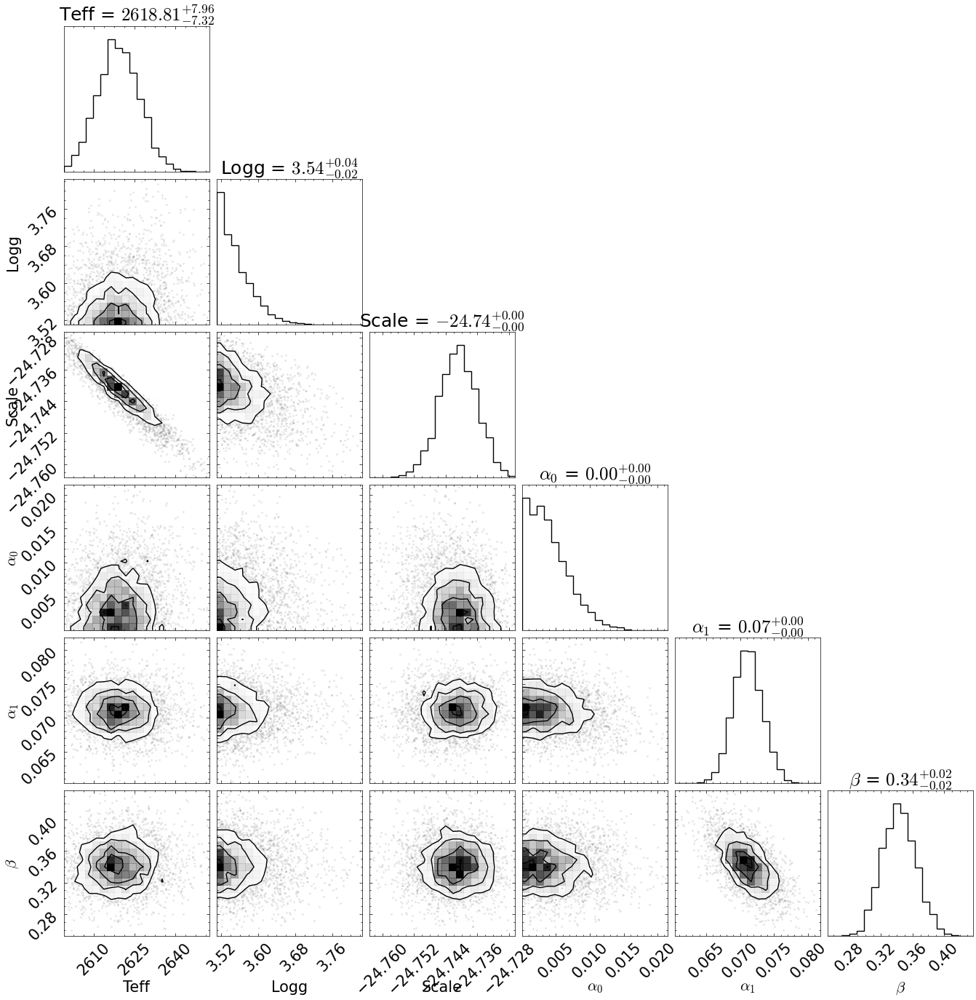

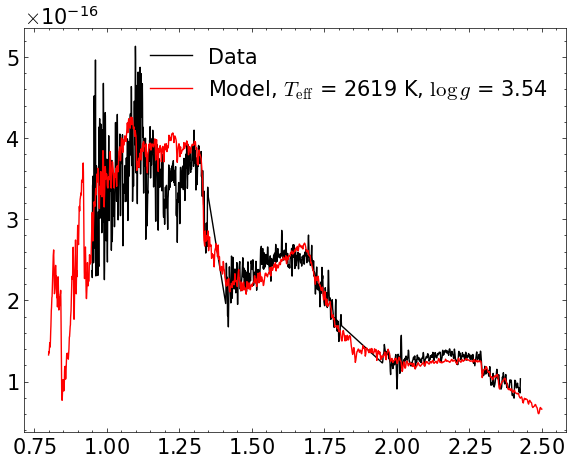


logZ = 60717.144 +- 0.321
  single instance: logZ = 60717.144 +- 0.292
  bootstrapped   : logZ = 60717.162 +- 0.321
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2597.0│ ▁▁▁▁▁▃▃▃▅▅▅▆▇▇▆▆▆▆▄▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁ ▁ │2654.3    2619.1 +- 7.6
    Logg                : 3.510 │▇▇▆▅▅▄▃▃▃▃▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁▁   ▁  ▁ │3.814     3.552 +- 0.036
    Scale               : -24.7618│ ▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▄▅▅▆▆▇▇▆▆▆▅▅▃▂▃▂▁▁▁▁▁▁ │-24.7249    -24.7409 +- 0.0048
    $\alpha_0$          : 0.0000│▇▇▇▆▇▇▆▆▆▅▄▄▄▃▃▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁  ▁▁ │0.0204    0.0040 +- 0.0030
    $\alpha_1$          : 0.0622│ ▁ ▁▁▁▁▁▁▁▂▂▃▄▄▅▇▇▆▇▆▇▅▄▄▃▃▂▁▁▁▁▁▁▁▁ ▁ │0.0802    0.0711 +- 0.0021
    $\beta$             : 0.255 │ ▁▁▁▁▁▁▁▁▁▂▃▃▄▆▅▆▇▇▇▆▆▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁ │0.440     0.343 +- 0.021



In [69]:
ut_sampler = prepare_ultranest(lnlike_factor, labels_factor, bounds_factor, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_factor, labels_factor, bounds_factor, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

The logZ is slightly improved in both cases, but include an additional parameter - So we choose to stick to the previous model.

# Including a wavelength shift
We now include a wavelength shift to our model, based on the IAU formula for air correction + a wavelength shift due to radial velocity. Let's see if it changes the results.

In [70]:
@njit
def lnlike_vrad(theta, wave, flux, noise, weights) : 
    teff, logg, scale, alpha_0, alpha_1, vrad = theta
    model = sofi_interpolator((teff, logg)) * 10**scale
    # Radial velocity shift : 
    model_air_wave = sofi_model_wave * (1.0 + vrad / 299792.458) * 1e4
    model_air_wave = (model_air_wave / (1.0 + 2.735182E-4 + 131.4182 / model_air_wave**2 + 2.76249E8 / model_air_wave**4))/1e4
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, model_air_wave, model)
    data_variance = (noise)**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    return -0.5 * (chi2 + var_term)
labels_vrad = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$", r"$v_\mathrm{rad}$"]
bounds_vrad = np.array([*bounds_base, [0, 1], [0, 1], [-1000, 1000.0]])

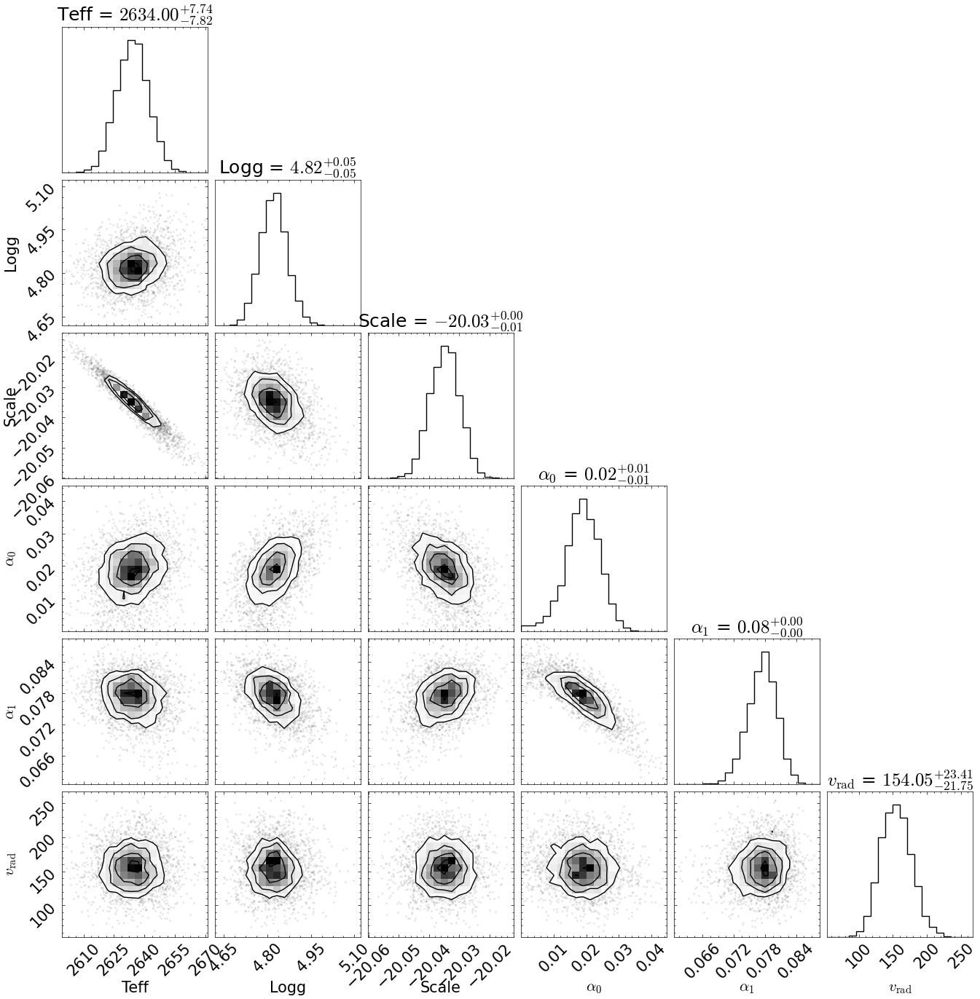

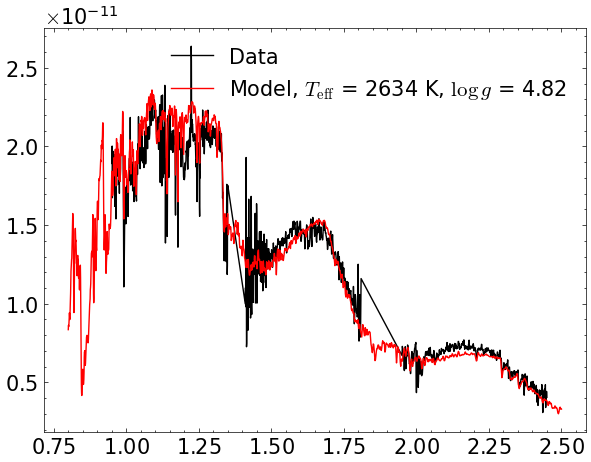


logZ = 39471.578 +- 0.680
  single instance: logZ = 39471.578 +- 0.272
  bootstrapped   : logZ = 39471.576 +- 0.680
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2600.7│ ▁▁▁▁▁▁▁▁▁▁▂▃▄▄▅▆▆▇▇▇▆▆▅▄▃▃▂▁▁▁▁▁▁▁▁▁▁ │2667.3    2634.1 +- 7.8
    Logg                : 4.621 │ ▁▁▁▁▁▁▁▁▁▂▃▃▄▆▆▇▆▇▇▆▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁ │5.059     4.822 +- 0.047
    Scale               : -20.0564│ ▁▁▁▁▁▁▁▁▁▁▂▂▃▄▅▄▆▇▇▇▇▆▅▅▄▃▂▂▁▁▁▁▁▁▁▁▁ │-20.0143    -20.0349 +- 0.0049
    $\alpha_0$          : 0.0000│▁▁▁▁▁▁▁▁▂▂▂▃▄▅▆▆▇▇▇▆▆▆▅▄▃▂▂▁▁▁▁▁▁▁▁▁ ▁ │0.0419    0.0187 +- 0.0055
    $\alpha_1$          : 0.0630│ ▁ ▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▄▅▆▆▇▇▆▅▅▄▂▂▁▁▁▁▁▁ ▁ │0.0883    0.0774 +- 0.0028
    $v_\mathrm{rad}$    : 66    │ ▁▁▁▁▁▁▁▁▂▂▃▄▅▆▇▇▇▇▇▇▇▅▄▄▃▂▁▁▁▁▁▁▁▁▁▁▁ │252       155 +- 22



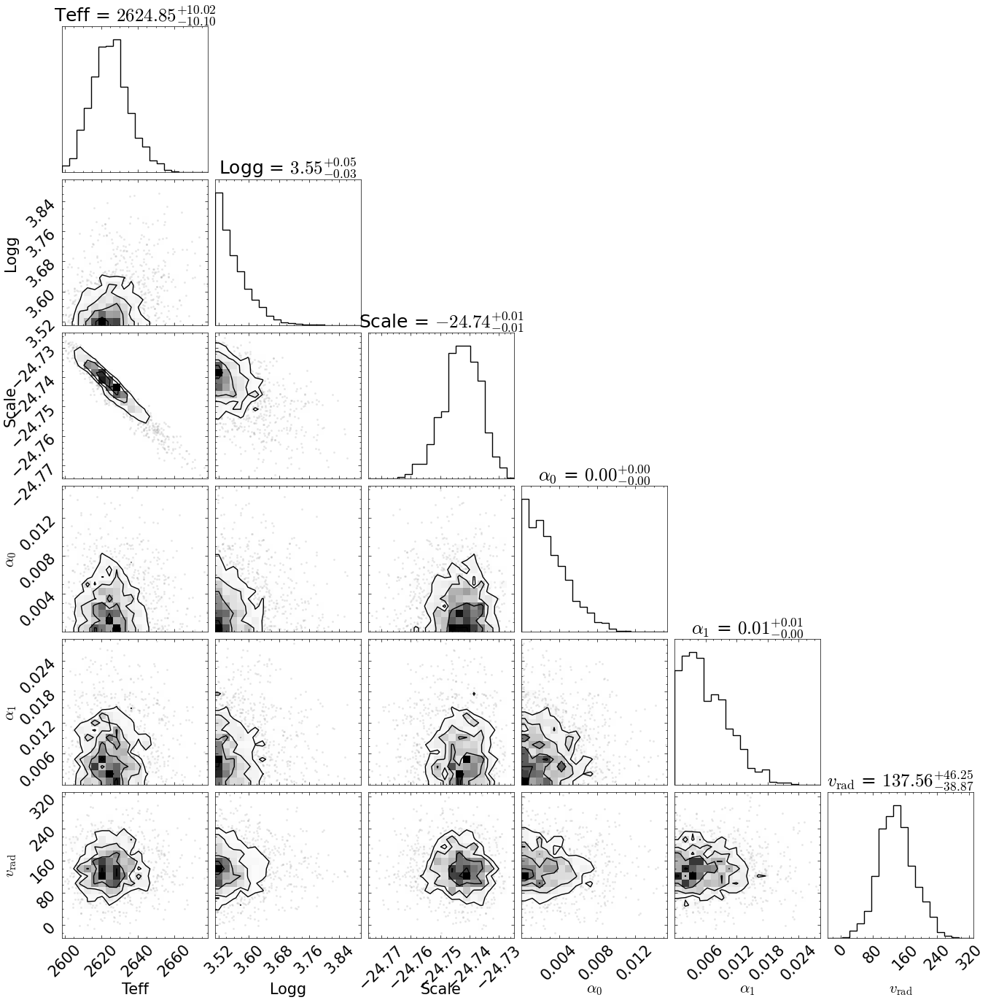

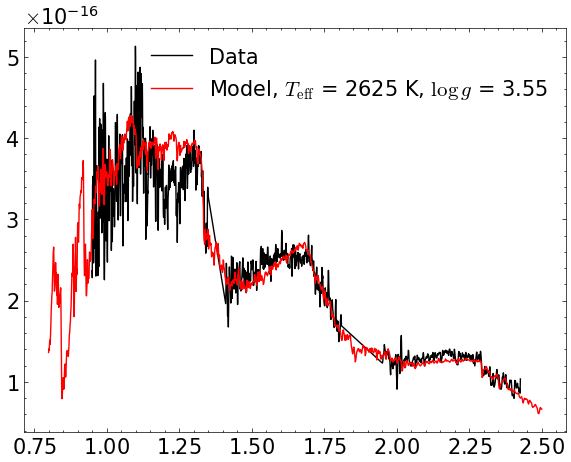


logZ = 60469.002 +- 0.656
  single instance: logZ = 60469.002 +- 0.267
  bootstrapped   : logZ = 60469.124 +- 0.656
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2595  │ ▁▁▁▁▂▂▃▄▅▆▆▆▅▇▇▇▆▅▄▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁ ▁ │2673      2625 +- 10
    Logg                : 3.510 │▇▇▅▅▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁     ▁ │3.872     3.561 +- 0.045
    Scale               : -24.7734│ ▁  ▁ ▁▁▁▁▁▁▁▁▂▂▃▃▃▄▆▇▇▇▇▆▆▅▅▄▃▂▁▁▁▁ ▁ │-24.7225    -24.7428 +- 0.0064
    $\alpha_0$          : 0.0000│▇▇▆▅▆▆▆▅▅▅▄▄▄▄▃▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁ ▁▁ ▁ │0.0130    0.0029 +- 0.0022
    $\alpha_1$          : 0.0000│▆▆▆▇▅▇▆▇▅▄▅▅▄▅▃▃▃▂▂▂▁▁▁▁▁▁▁ ▁▁▁▁▁  ▁ ▁ │0.0273    0.0063 +- 0.0044
    $v_\mathrm{rad}$    : -24   │ ▁▁▁▁▁▁▁▁▁▁▃▃▄▅▇▆▇▆▆▇▇▅▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁ │305       139 +- 43



In [71]:
ut_sampler = prepare_ultranest(lnlike_vrad, labels_vrad, bounds_vrad, spec_wave, spec_flux, spec_noise, spec_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_wave, spec_flux)

ut_sampler = prepare_ultranest(lnlike_vrad, labels_vrad, bounds_vrad, spec_simp_wave, spec_simp_flux, spec_simp_noise, spec_simp_weights_norm)
ut_sampler.run(viz_callback=False, show_status=False)
plot_ultranest(ut_sampler, spec_simp_wave, spec_simp_flux)

This shift a bit the log g results, but not the Teff. Log g results remain inconsistent for the field dwarf. 

# Including the photometry :
We still do not include parallax, but we're coming to that ! We add the photometry interpolation to the results, just using J/Ks 2MASS bands, and another scaling factor. We just use the sofi spec now.

In [18]:
# The likelihood with scale factors included here is WAY faster than the one included in the paper - however, it yelds to exactly the same results. I'll switch to this likelihood when launching the analys on the 
# whole GUCDs sample, as ultranest is likely a better, more stable, option!

@njit
def lnlike_phot(theta, wave, flux, noise, weights, photometry, photometry_noise, photometry_weights) : 
    teff, logg, scale, alpha_0, alpha_1, vrad, radius, parallax = theta
    scale_phot = (radius*parallax*2.3168979296095656e-09/1000)**2
    model = sofi_interpolator((teff, logg)) * 10**scale
    model_phot = phot_interpolator((teff, logg)) * scale_phot
    # Radial velocity shift : 
    model_air_wave = sofi_model_wave * (1.0 + vrad / 299792.458) * 1e4
    model_air_wave = (model_air_wave / (1.0 + 2.735182E-4 + 131.4182 / model_air_wave**2 + 2.76249E8 / model_air_wave**4))/1e4
    # Interpolate the model on the spectrum wave grid
    model_flux = np.interp(wave, model_air_wave, model)
    data_variance = (noise)**2 + (alpha_0 * np.median(model_flux))**2 + (alpha_1 * model_flux)**2
    chi2 = np.sum(weights * (flux - model_flux)**2 / data_variance)
    var_term = np.sum(np.log(2*np.pi*data_variance))
    # Mask the objects with 0 weights in phot : 
    mask_phot = photometry_weights > 0.0
    phot_chi2 = np.sum(photometry_weights[mask_phot] * (photometry[mask_phot] - model_phot[mask_phot])**2 / photometry_noise[mask_phot]**2)
    phot_var_term = np.sum(np.log(2*np.pi*photometry_noise[mask_phot]**2))
    return -0.5 * (chi2 + var_term + phot_chi2 + phot_var_term)
labels_phot = ["Teff", "Logg", "Scale", r"$\alpha_0$", r"$\alpha_1$", r"$v_\mathrm{rad}$", "Radius", "Parallax"]
bounds_phot = np.array([*bounds_base, [0, 1], [0, 1], [-1000, 1000.0], [0, 1000]])

# We also have to redefine the ultranest functions to include the photometry : 
from numba_stats import norm
# Call the norm once to compile it
test = norm.ppf(0.50, parallax[0], parallax[1])

def prepare_ultranest_phot(lnlike, labels, bounds, spec_wave, spec_flux, spec_noise, spec_weights, photometry, photometry_noise, photometry_weights, parallax, parallax_error) : 
    # Cube transform : 
    @njit
    def cube_transform(cube) : 
        theta = cube.copy()
        for i in range(len(bounds)) : 
            theta[:,i] = bounds[i][0] + (bounds[i][1] - bounds[i][0]) * theta[:, i]
        theta[:, -1] = norm.ppf(theta[:,-1], parallax, parallax_error)
        return theta
    # Simplified lnlike :
    @njit
    def lnlike_simple(theta) : 
        return_log = np.zeros(len(theta))
        for i,t in enumerate(theta) : 
            return_log[i] = lnlike(t, spec_wave, spec_flux, spec_noise, spec_weights, photometry, photometry_noise, photometry_weights)
        # return lnlike(theta, spec_wave, spec_flux, spec_noise, spec_weights, photometry, photometry_noise, photometry_weights)
        return return_log
    # Ultranest sampler : 
    sampler = ultranest.ReactiveNestedSampler(labels, lnlike_simple, transform=cube_transform, vectorized=True)
    return sampler   


def plot_ultranest(sampler, spec_wave, spec_flux):
    from ultranest import plot as utplot
    thetares = sampler.results['posterior']['median']
    range_plot = np.ones_like(thetares)
    model = sofi_interpolator((thetares[0], thetares[1])) * 10**thetares[2]
    utplot.cornerplot(sampler.results, range=range_plot)
    # sampler.plot_corner(range=range_plot)
    fig, ax = plt.subplots(1, 1)
    ax.plot(spec_wave, spec_flux, label = "Data", c='k')
    ax.plot(sofi_model_wave, model, label = f"Model, $T_\mathrm{{eff}}$ = {thetares[0]:.0f} K, $\log g$ = {thetares[1]:.2f}", c='r')
    ax.legend()
    plt.show()
    sampler.print_results()
    return None

In [13]:
sofi_phot = np.array([sed[mag][0] for mag in photometric_list]) # This is ordered correctly relatively to models ;)
sofi_phot_noise = np.array([sed[mag][1] for mag in photometric_list])
# We just use J and K bands : 
sofi_phot_weights_ones = np.array([0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0])
sofi_phot_weights_fwhm = np.array([0.0, 1624.32, 2618.87, 0.0, 0.0, 0.0, 0.0, 0.0]) / 1e4

# weights_factor = (len(spec_weights_dlambda) + 2) / (np.sum(spec_weights_dlambda) + np.sum(sofi_phot_weights_fwhm))

spec_adopted_weights = (len(spec_weights_dlambda)) / (np.sum(spec_weights_dlambda)) * spec_weights_dlambda
phot_adopted_weights = (2) / (np.sum(sofi_phot_weights_fwhm)) * sofi_phot_weights_fwhm

# spec_adopted_weights = weights_factor * spec_weights_dlambda
# phot_adopted_weights = weights_factor * sofi_phot_weights_fwhm

# Now we're ready to run ! 

In [20]:
bounds_phot = np.array([*bounds_base, [0, 1], [0, 1], [-1000, 1000.0], [0, 1000]])


In [22]:
ut_sampler = prepare_ultranest_phot(lnlike_phot, labels_phot, bounds_phot, spec_wave, spec_flux, spec_noise, spec_weights_ones, sofi_phot, sofi_phot_noise, sofi_phot_weights_ones, float(parallax[0]), float(parallax[1]))
res = ut_sampler.run(show_status=True) #viz_callback=True



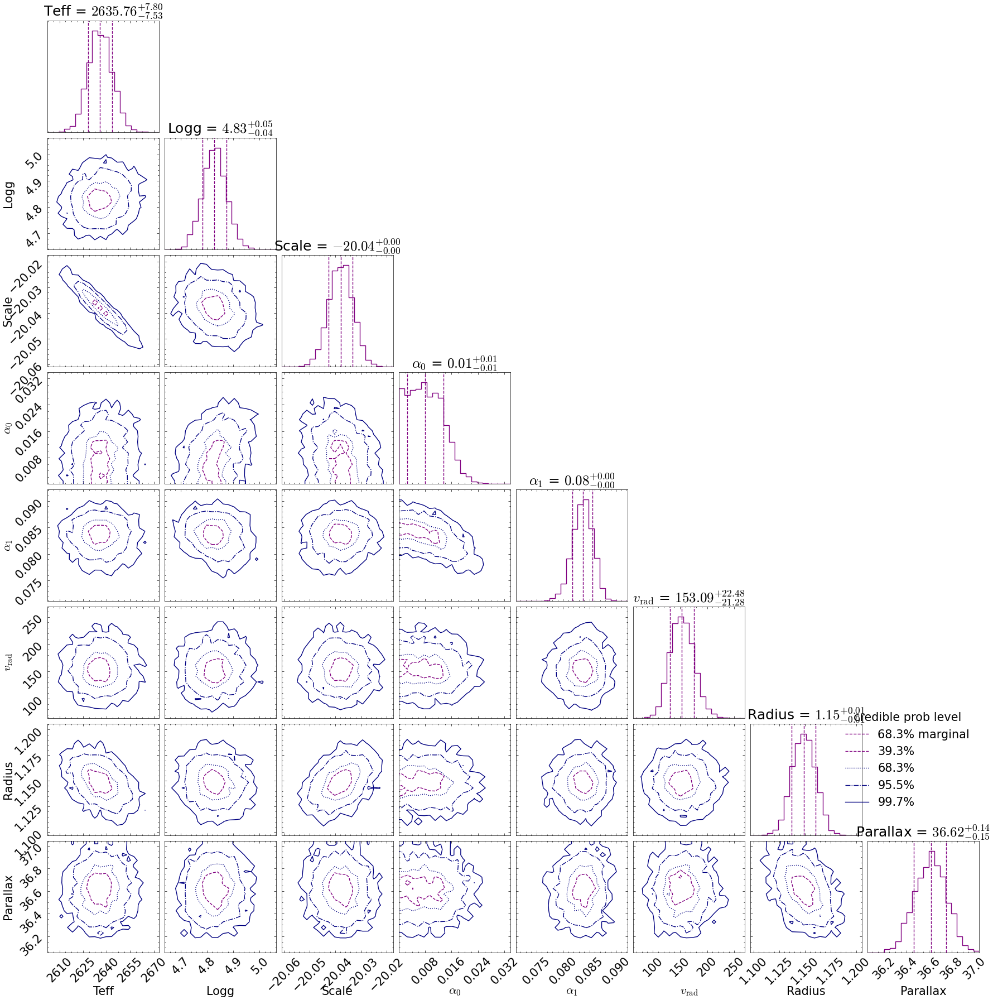

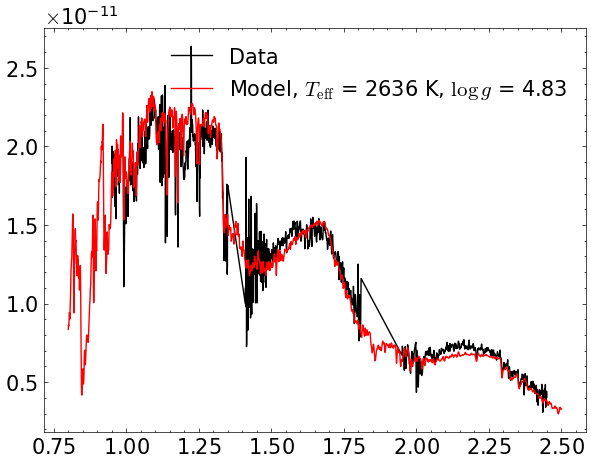


logZ = 39476.649 +- 0.410
  single instance: logZ = 39476.649 +- 0.312
  bootstrapped   : logZ = 39476.663 +- 0.410
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2603.7│ ▁ ▁▁▁▁▁▁▁▃▃▄▅▇▇▇▇▇▇▆▄▄▃▂▂▁▁▁▁▁▁▁▁▁  ▁ │2676.4    2635.8 +- 7.7
    Logg                : 4.638 │ ▁ ▁▁▁▁▁▁▁▂▂▃▄▅▅▇▇▇▇▇▆▅▄▃▃▂▁▁▁▁▁▁▁▁▁▁▁ │5.034     4.828 +- 0.045
    Scale               : -20.0639│ ▁   ▁▁▁▁▁▁▁▁▁▂▂▃▄▅▆▇▇▇▇▇▆▄▃▃▂▁▁▁▁▁▁▁▁ │-20.0183    -20.0379 +- 0.0047
    $\alpha_0$          : 0.0000│▆▇▆▇▆▆▆▆▇▇▆▆▆▆▆▆▆▆▅▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁ │0.0291    0.0083 +- 0.0051
    $\alpha_1$          : 0.0719│ ▁    ▁▁▁▁▁▁▁▁▁▂▃▄▄▅▆▇▇▆▆▄▄▃▂▁▁▁▁▁▁▁ ▁ │0.0929    0.0837 +- 0.0019
    $v_\mathrm{rad}$    : 54    │ ▁  ▁▁▁▁▁▁▂▃▄▅▅▇▇▇▇▆▆▅▄▃▂▂▁▁▁▁▁▁▁ ▁  ▁ │273       154 +- 22
    Radius              : 1.104 │ ▁▁▁▁▁▁▁▁▂▂▃▃▄▅▅▇▇▇▇▇▆▅▅▄▄▃▂▁▁▁▁▁▁▁▁▁▁ │1.196     1.149 +- 0.012
    Parallax            : 36.08 │ ▁▁  ▁▁▁▁▁▂▃▃▃▄▄▆▅▆▆▇▇▆▆▆▅▄▄▃▃▁▁▁▁▁▁▁▁ │37.09     36.61 

In [23]:
plot_ultranest(ut_sampler, spec_wave, spec_flux)

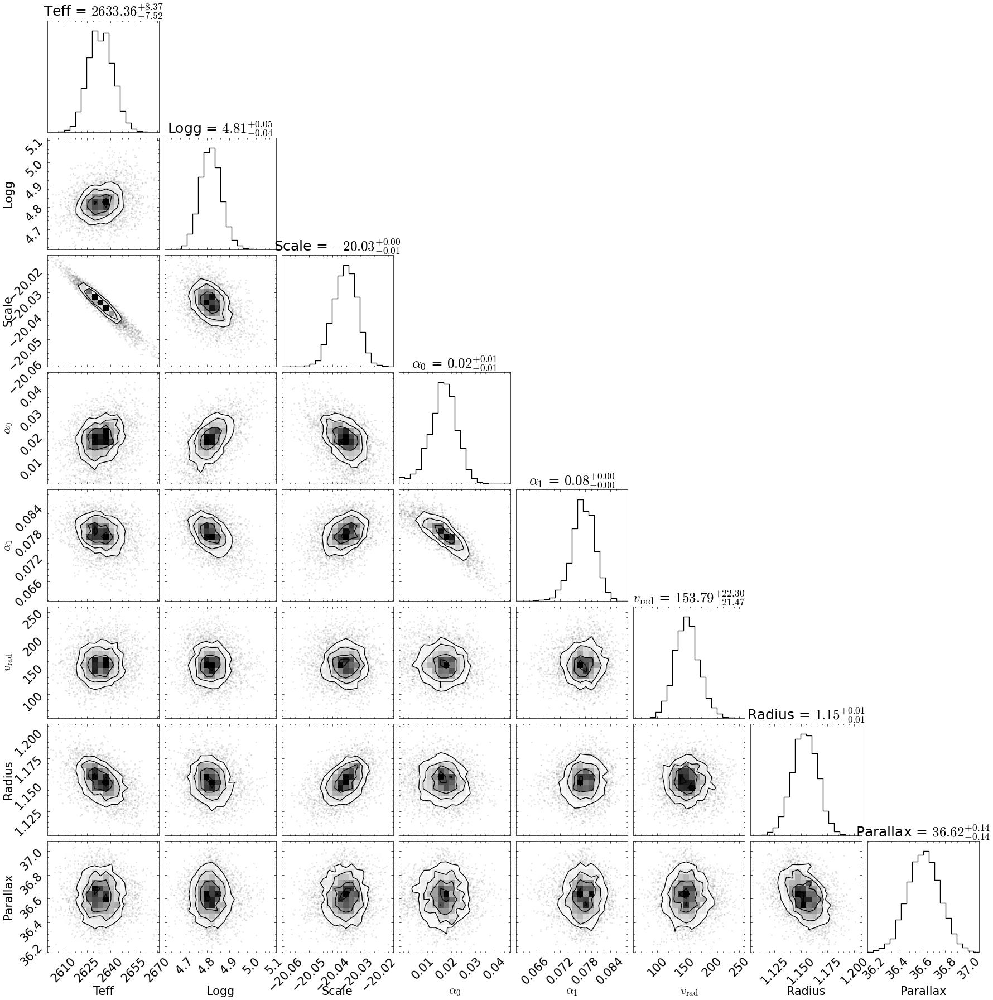

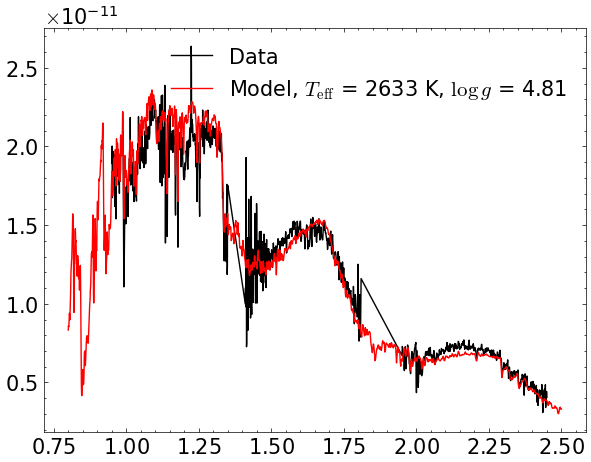


logZ = 39516.200 +- 0.367
  single instance: logZ = 39516.200 +- 0.315
  bootstrapped   : logZ = 39516.161 +- 0.367
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    Teff                : 2599.8│ ▁▁ ▁▁▁▁▁▁▂▂▃▃▅▆▇▇▆▇▆▆▅▅▃▂▂▁▁▁▁▁▁▁▁▁ ▁ │2670.5    2633.7 +- 8.0
    Logg                : 4.627 │ ▁▁▁▁▁▁▁▁▂▂▃▄▅▆▇▇▆▇▆▅▄▂▃▂▁▁▁▁▁▁▁▁▁▁▁ ▁ │5.062     4.817 +- 0.048
    Scale               : -20.0594│ ▁  ▁▁▁▁▁▁▁▁▁▂▃▃▄▅▆▇▇▇▇▇▇▆▅▃▂▂▁▁▁▁▁▁▁▁ │-20.0144    -20.0345 +- 0.0051
    $\alpha_0$          : 0.0000│▁▁▁▁▁▁▁▂▂▃▃▄▅▅▆▇▇▇▇▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁▁  ▁ │0.0442    0.0185 +- 0.0057
    $\alpha_1$          : 0.0620│ ▁▁ ▁▁▁▁▁▁▁▁▁▁▁▂▂▂▃▄▅▇▇▆▇▆▆▅▄▃▂▂▁▁▁▁▁▁ │0.0876    0.0775 +- 0.0028
    $v_\mathrm{rad}$    : 65    │ ▁▁▁▁▁▁▁▁▂▂▂▄▄▆▆▇▇▇▇▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁ │254       154 +- 22
    Radius              : 1.104 │ ▁▁ ▁▁▁▁▁▁▂▂▃▃▄▅▇▇▇▇▇▇▆▆▅▄▃▂▂▁▁▁▁▁▁▁ ▁ │1.203     1.153 +- 0.012
    Parallax            : 36.10 │ ▁▁▁▁▁▁▁▁▁▂▃▃▄▅▅▆▆▆▇▇▆▆▆▄▄▃▃▂▂▁▁▁▁▁▁▁▁ │37.13     36.62 

In [77]:
ut_sampler = prepare_ultranest_phot(lnlike_phot, labels_phot, bounds_phot, spec_wave, spec_flux, spec_noise, spec_adopted_weights, sofi_phot, sofi_phot_noise, phot_adopted_weights, float(parallax[0]), float(parallax[1]))
ut_sampler.run(show_status=True) #viz_callback=True
plot_ultranest(ut_sampler, spec_wave, spec_flux)
